##### imports
# TO-DO:
* XAI techniques
    - ~Grad-CAM~
    - ~LIME(?)~
    - ~Feature Extraction + UMAP~

In [ ]:
import tensorflow as tf
import keras
from keras.saving import load_model
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.applications import MobileNetV2
from keras import layers,models
from tensorflow import data as tf_data
import os
import random
import zipfile
import shutil
import pandas as pd
from sklearn.metrics import (roc_curve, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay,classification_report)
import reload_data2
from google.colab import drive
drive.mount('/content/drive')

#!pip uninstall -y sympy
#!pip install sympy==1.12
#import umap
#from sklearn.manifold import TSNE
import random

! pip install lime
from lime import lime_image
from skimage.segmentation import mark_boundaries


os.environ["KERAS_BACKEND"] = "tensorflow"

# Display
from IPython.display import Image, display
import matplotlib as mpl
import matplotlib.cm as cm

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Data Loading

In [ ]:
df = pd.read_csv("/content/Handwriting_Metadata_clean.csv")
df=df.sort_values(by="wid").reset_index(drop=True)
df.head(5)

,wid,agegroup,gender,handedness
0,w0001,25-40,female,right
1,w0002,41-60,male,right
2,w0003,25-40,female,right
3,w0004,18-24,female,ambidextrous
4,w0005,18-24,male,right


In [ ]:
drive_dir="/content/drive/MyDrive/CSAFE_zips"
data_dir = "/content/Data"

In [ ]:
%%time
try:
    shutil.rmtree(data_dir)
    os.mkdir(data_dir)
except:
    pass

zips=list()
for path in os.listdir("/content/drive/MyDrive/CSAFE_zips"):
    if ".zip" in path:
        zips.append(path)

for z in zips:
    print(f"Unzipping: {z}")
    try:
        reload_data2.unzip(f"{drive_dir}/{z}",data_dir)
    except zipfile.BadZipFile:
        print(f"ERROR: {z}")
    print()

Unzipping: CSAFE_All_Images_3.zip

Unzipping: CSAFE_All_Images_4.zip

Unzipping: CSAFE_All_Images_1.zip

Unzipping: CSAFE_All_Images_2.zip

CPU times: user 17.4 s, sys: 8.05 s, total: 25.4 s
Wall time: 1min 25s


In [ ]:
list(os.listdir(data_dir))[::800]

['w0698_s02_pWOZ_r01.png',
 'w0653_s02_pWOZ_r01.png',
 'w0693_s02_pWOZ_r03.png',
 'w0719_s01_pLND_r03.png',
 'w0205_s02_pPHR_r03.png',
 'w0284_s01_pPHR_r03.png',
 'w0009_s02_pWOZ_r02.png',
 'w0293_s02_pLND_r02.png',
 'w0549_s02_pWOZ_r01.png',
 'w0341_s02_pLND_r01.png',
 'w0600_s03_pWOZ_r02.png',
 'w0186_s01_pPHR_r03.png',
 'w0448_s01_pLND_r03.png',
 'w0428_s02_pLND_r01.png',
 'w0191_s03_pWOZ_r03.png',
 'w0379_s01_pLND_r01.png',
 'w0131_s03_pLND_r03.png']

In [ ]:
reload_data2.organize_unzipped_files(data_dir)

In [ ]:
reload_data2.stratify_split_alt(data_dir,475)

Using 475 class labels


In [ ]:
IMAGE_SIZE = (384,384)
BATCH_SIZE = 64
INPUT_SHAPE = IMAGE_SIZE + (3,)
NUM_CLASSES = 475

In [ ]:
train_ds,val_ds,test_ds=reload_data2.train_val_test_split(data_dir,IMAGE_SIZE,BATCH_SIZE)

Found 7125 files belonging to 475 classes.
Found 2850 files belonging to 475 classes.
Found 2850 files belonging to 475 classes.


# UMAP + TSNE Projections
### (copy pasted from `AllClass+CustomCNN.ipynb`)


In [ ]:
model = load_model("/content/MobileNetV2_allclass.keras")

In [ ]:
model.summary()

Model: "mobilenet_allclass"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [ ]:
feature_extractor = tf.keras.Model(
    inputs=model.input,
    outputs=model.layers[-3].output
)

features = feature_extractor.predict(test_ds)

45/45 ━━━━━━━━━━━━━━━━━━━━ 494s 10s/step


In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30)
proj = tsne.fit_transform(features)

In [ ]:
#get labels

labels = np.concatenate([y for x, y in test_ds], axis=0)

# convert from one-hot if necessary
#labels = np.argmax(labels, axis=1)

### t-sne

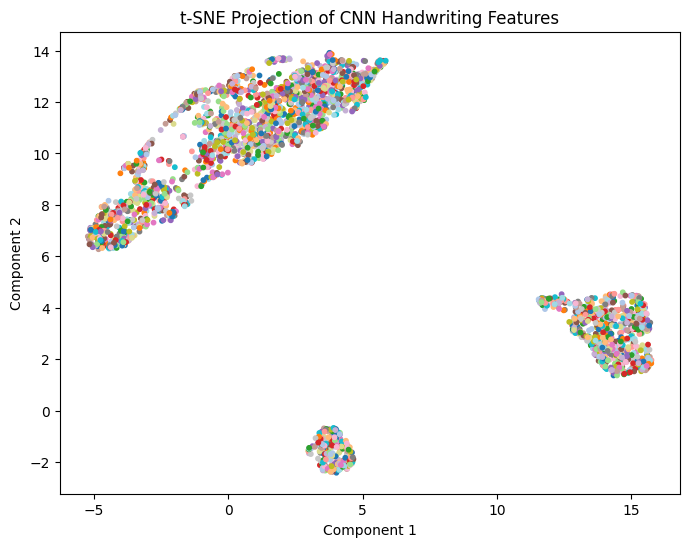

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    proj[:,0],
    proj[:,1],
    c=labels,
    cmap="tab20",
    s=10
)

plt.title("t-SNE Projection of CNN Handwriting Features")
plt.xlabel("Component 1")
plt.ylabel("Component 2")

plt.show()

    subset

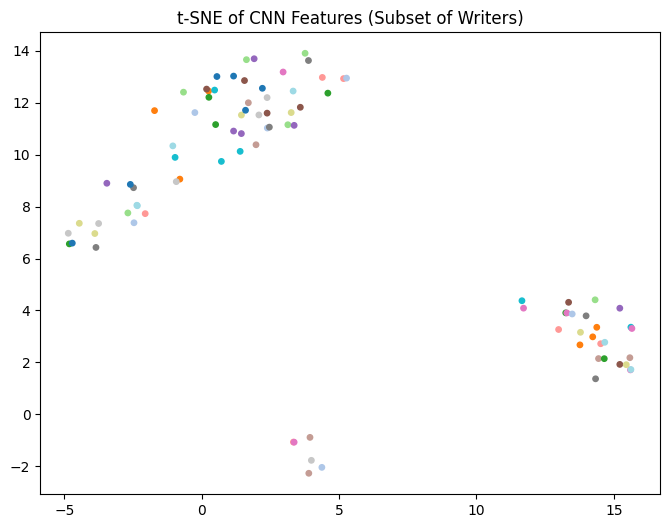

In [ ]:
subset_classes = np.unique(labels)[:15]   # first 15 writers

mask = np.isin(labels, subset_classes)

proj_subset = proj[mask]
labels_subset = labels[mask]

plt.figure(figsize=(8,6))

plt.scatter(
    proj_subset[:,0],
    proj_subset[:,1],
    c=labels_subset,
    cmap="tab20",
    s=15
)

plt.title("t-SNE of CNN Features (Subset of Writers)")
plt.show()

### umap

In [ ]:
import umap

reducer = umap.UMAP(
    n_components=2,
    n_neighbors=15,
    random_state=410
)

proj = reducer.fit_transform(features)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


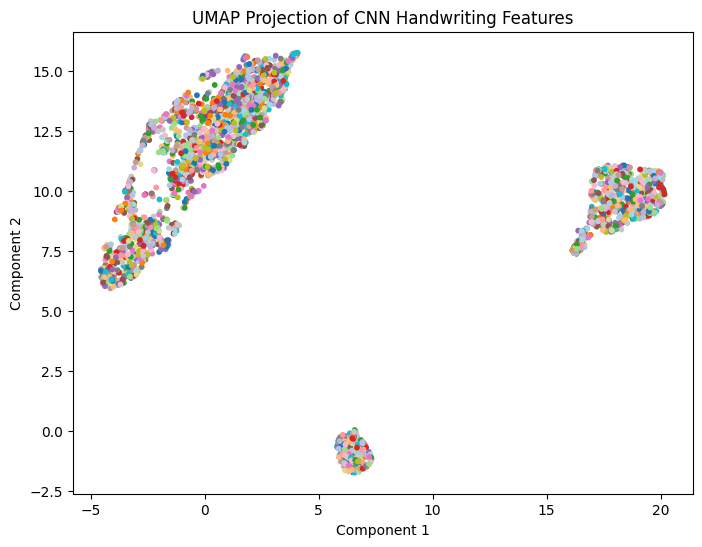

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    proj[:,0],
    proj[:,1],
    c=labels,
    cmap="tab20",
    s=10
)

plt.title("UMAP Projection of CNN Handwriting Features")
plt.xlabel("Component 1")
plt.ylabel("Component 2")

plt.show()

In [ ]:
subset_classes = np.unique(labels)[:15]   # first 15 writers

mask = np.isin(labels, subset_classes)

proj_subset = proj[mask]
labels_subset = labels[mask]

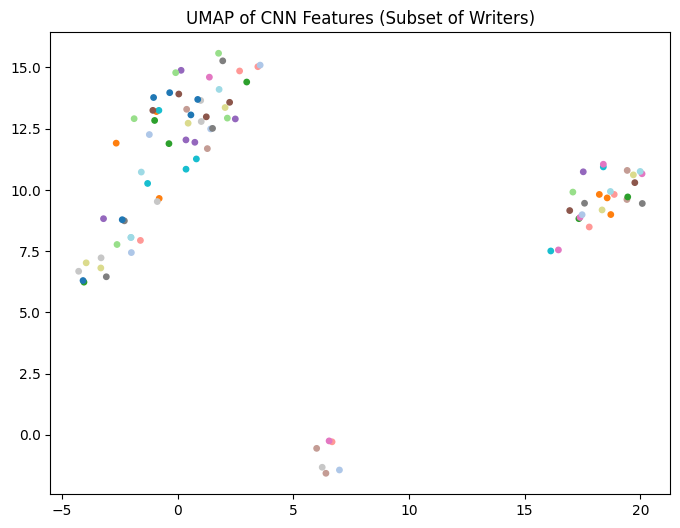

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    proj_subset[:,0],
    proj_subset[:,1],
    c=labels_subset,
    cmap="tab20",
    s=15
)

plt.title("UMAP of CNN Features (Subset of Writers)")
plt.show()

#### By mean

In [ ]:
unique_writers = np.unique(labels)

mean_embeddings = []
writer_ids = []

for writer in unique_writers:

    writer_features = features[labels == writer]

    mean_embedding = writer_features.mean(axis=0)

    mean_embeddings.append(mean_embedding)
    writer_ids.append(writer)

mean_embeddings = np.array(mean_embeddings)

In [ ]:
reducer = umap.UMAP(
    n_components=2,
    n_neighbors=15,
    random_state=410
)

proj = reducer.fit_transform(mean_embeddings)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


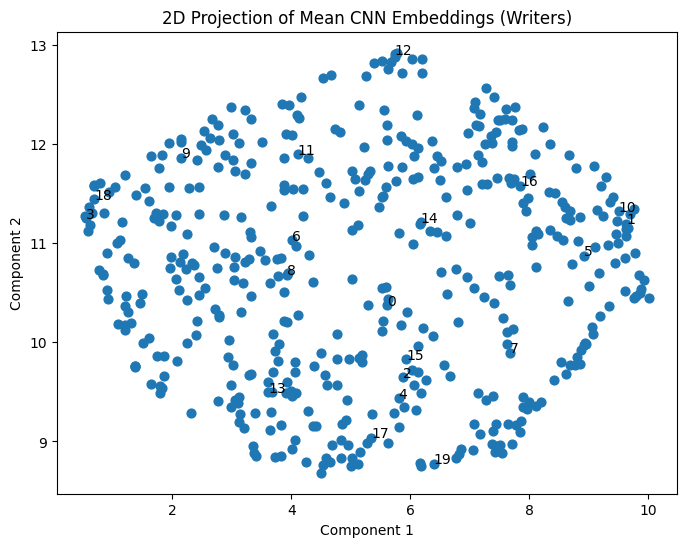

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    proj[:,0],
    proj[:,1],
    #c=writer_ids,
    #cmap="tab20",
    s=40
)

plt.title("2D Projection of Mean CNN Embeddings (Writers)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")

for i in range(20):
    plt.text(proj[i,0], proj[i,1], str(writer_ids[i]), fontsize=10)

plt.show()

## 90 Class

In [ ]:
model90 = load_model("/content/MobileNetV2_highres2.keras")
model90.summary()

Model: "mobilenet_highres2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 14, 14, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │       115,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,603,856 (9.93 MB)

 Trainable params: 115,290 (450.35 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 230,582 (900.71 KB)

In [ ]:
! unzip "/content/Handwriting_Images_90sorted.zip"

In [ ]:
reload_data2.stratify_split_alt("/content/Handwriting_Images")

Found 1350 files belonging to 90 classes.
Found 540 files belonging to 90 classes.
Found 540 files belonging to 90 classes.


In [ ]:
train_ds,val_ds,test_ds=reload_data2.train_val_test_split(
    "/content/Handwriting_Images",(442,442),64)

Found 1350 files belonging to 90 classes.
Found 540 files belonging to 90 classes.
Found 540 files belonging to 90 classes.


In [ ]:
feature_extractor = tf.keras.Model(
    inputs=model90.input,
    outputs=model90.layers[-3].output
)

features = feature_extractor.predict(test_ds)

9/9 ━━━━━━━━━━━━━━━━━━━━ 146s 13s/step


In [ ]:
labels = np.concatenate([y for x, y in test_ds], axis=0)

In [ ]:
!pip uninstall -y sympy
!pip install sympy==1.12

Found existing installation: sympy 1.12
Uninstalling sympy-1.12:
  Successfully uninstalled sympy-1.12
  Using cached sympy-1.12-py3-none-any.whl.metadata (12 kB)
Using cached sympy-1.12-py3-none-any.whl (5.7 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.10.0+cpu requires sympy>=1.13.3, but you have sympy 1.12 which is incompatible.


In [ ]:
import umap

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


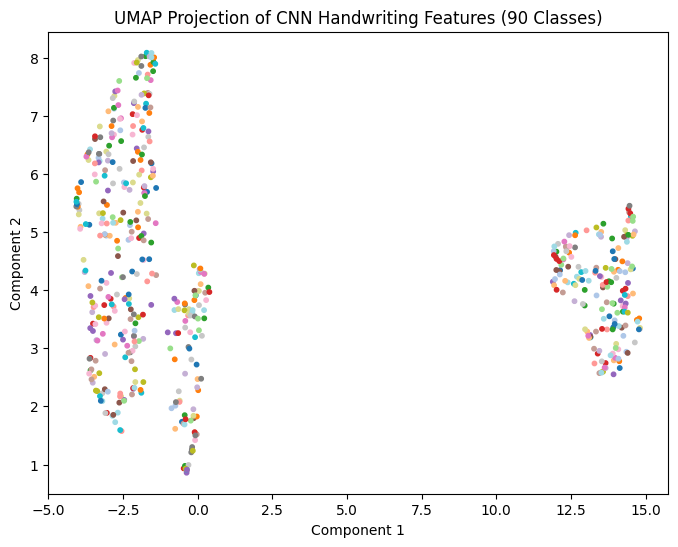

In [ ]:
#import umap

reducer = umap.UMAP(
    n_components=2,
    n_neighbors=15,
    random_state=410
)

proj = reducer.fit_transform(features)

plt.figure(figsize=(8,6))

plt.scatter(
    proj[:,0],
    proj[:,1],
    c=labels,
    cmap="tab20",
    s=10
)

plt.title("UMAP Projection of CNN Handwriting Features (90 Classes)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")

plt.show()

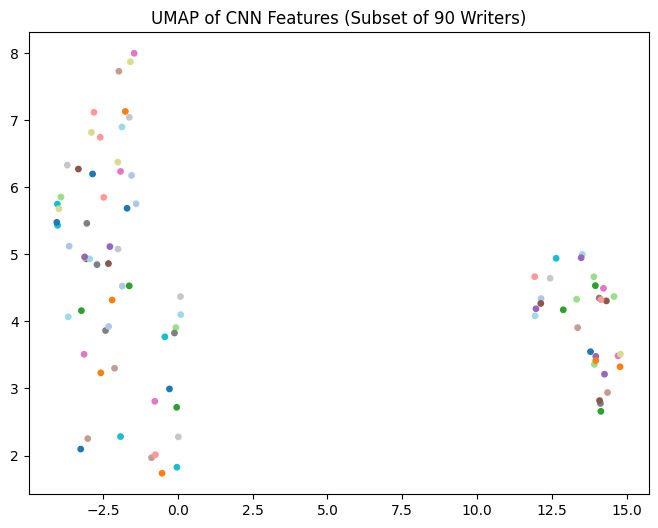

In [ ]:
subset_classes = np.unique(labels)[:15]   # first 15 writers

mask = np.isin(labels, subset_classes)

proj_subset = proj[mask]
labels_subset = labels[mask]


plt.figure(figsize=(8,6))

plt.scatter(
    proj_subset[:,0],
    proj_subset[:,1],
    c=labels_subset,
    cmap="tab20",
    s=15
)

plt.title("UMAP of CNN Features (Subset of 90 Writers)")
plt.show()

# GRAD-CAM

##### imports

In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import keras

# Display
from IPython.display import Image, display
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
model = load_model("/content/MobileNetV2_allclass.keras")
model.summary()

Model: "mobilenet_allclass"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

    need last convolutional layer

In [ ]:
for layer in model.layers:
    print(layer.name)

input_layer_1
mobilenetv2_1.00_224
dropout
global_average_pooling2d
dropout_1
dense


In [ ]:
base_model="mobilenetv2_1.00_224"

In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 192, 192,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 192, 192,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 192, 192,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 192, 192,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 192, 192,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 192, 192,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 192, 192,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 192, 192,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 193, 193,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 96, 96,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 96, 96,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 96, 96,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

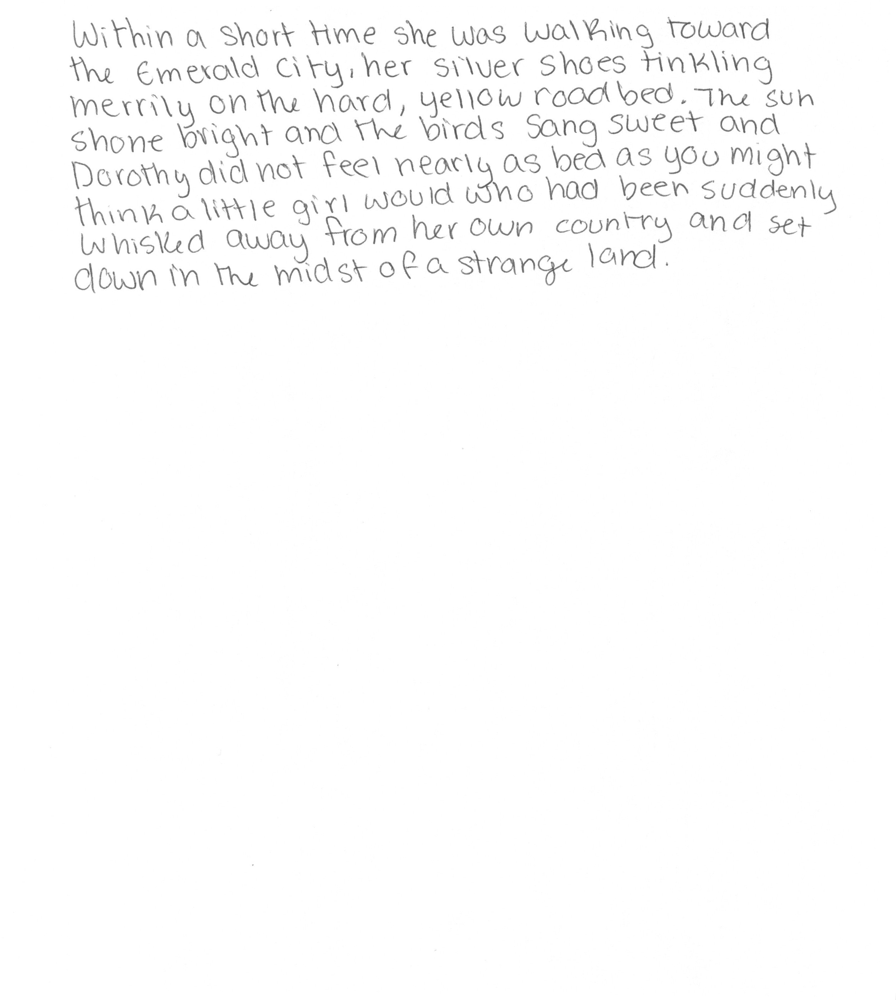

In [ ]:
img_path="/content/Data/test/w0122/w0122_s02_pWOZ_r03.png"#"/content/Data/test/w0198/w0198_s03_pWOZ_r01.png"
display(Image(img_path))

## Grad-CAM
Copied from: [Keras.io](https://keras.io/examples/vision/grad_cam/#:~:text=Setup,Copied!)

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

In [ ]:
def make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name, pred_index=None):
    # 1. Access the base MobileNetV2 layer
    base_model = model.get_layer("mobilenetv2_1.00_224")

    # 2. Build a model that stops at the base model's output
    # It returns [The Feature Map, The Base Predictions]
    grad_model = keras.models.Model(
        inputs=[base_model.inputs],
        outputs=[base_model.get_layer(last_conv_layer_name).output, base_model.output]
    )

    with tf.GradientTape() as tape:
        # Get the feature map and the base model's output
        last_conv_layer_output, base_preds = grad_model(img_array)

        # 3. Manually pass base_preds through the rest of the TOP of your model
        # We find where the base model sits in the main model's layers
        found_base = False
        x = base_preds
        for layer in model.layers:
            if found_base:
                x = layer(x)
            if layer == base_model:
                found_base = True

        final_preds = x # This is now your (1, 475) prediction tensor

###################################################################
        #if pred_index is None:
        #    pred_index = tf.argmax(final_preds[0])
        #class_channel = final_preds[:, pred_index]

        # Ensure final_preds is (1, 475)
        # If argmax is returning a list, it thinks the batch is 475!
        if pred_index is None:
            # We use axis=-1 to get the max class for the prediction
            pred_index = tf.argmax(final_preds[0], axis=-1)

        # We need pred_index to be a simple integer index
        class_channel = final_preds[:, pred_index]
###################################################################

    # 4. Calculate gradients
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # 5. Multiply the feature map by the importance of each channel
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # 6. Normalize
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

## Heatmaps & Visualization

In [ ]:
preprocess_input = keras.applications.mobilenet_v2.preprocess_input

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted: w0122


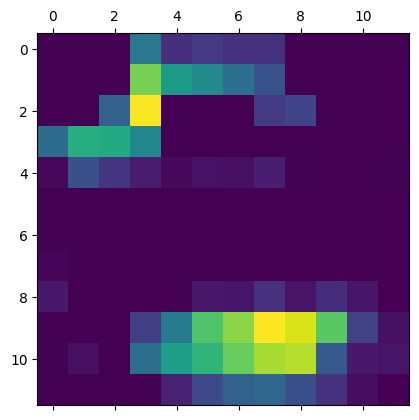

In [ ]:
# 1. Prepare image
img_array = preprocess_input(get_img_array(img_path, size=IMAGE_SIZE))

# 2. Prediction (Do NOT set .activation = None here)
preds = model.predict(img_array)
class_idx = np.argmax(preds[:3])
print("Predicted:", reload_data2.w_ids475[class_idx])

# 3. Generate heatmap
# Pass the original model; let the function handle the "grad_model" setup
# 1. Identify the name of your base model layer
# (Usually 'mobilenetv2' or 'functional_1')
base_model_name = "mobilenetv2_1.00_224"
# 2. Get the actual base model object
base_model = model.get_layer(base_model_name)
# 3. Pass the base model and the correct layer name to the function
heatmap = make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name="out_relu")

# 4. Display
plt.matshow(heatmap)
plt.show()

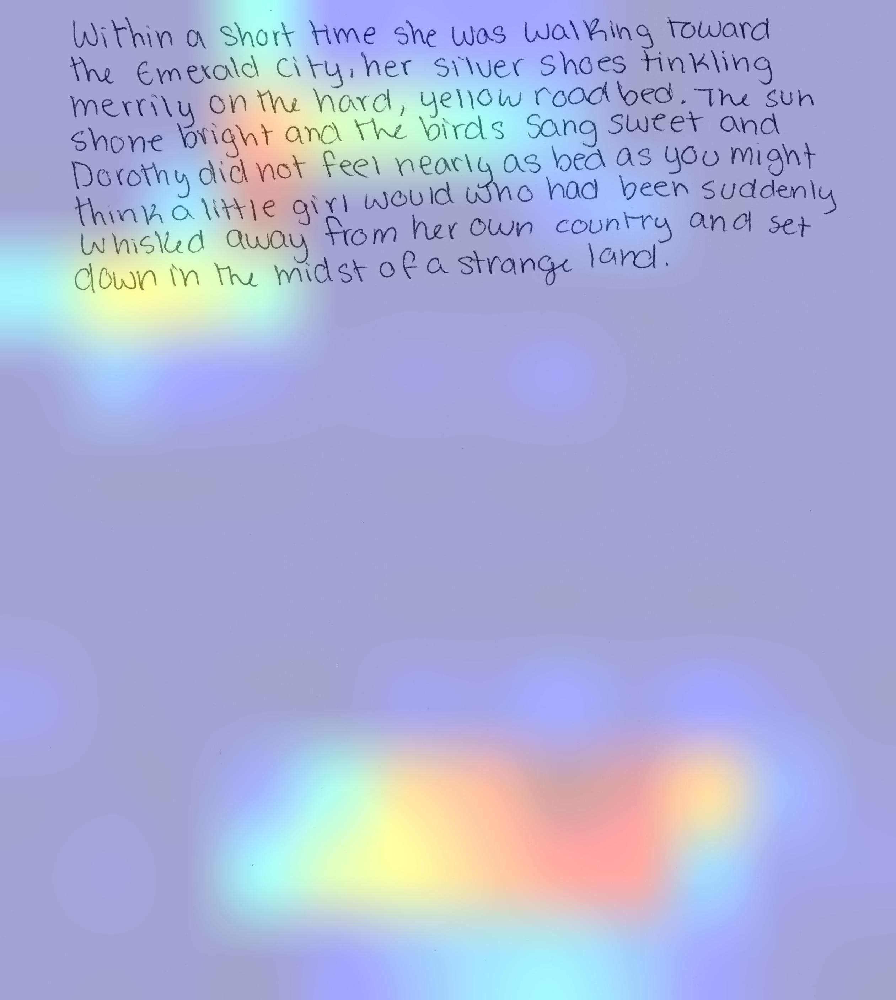

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

In [ ]:
def plot_gradcam_grid(img_paths, true_labels, model, last_conv_layer_name, class_list):
    """
    img_paths: List of 4 image paths
    true_labels: List of 4 true class names (strings)
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()

    for i, img_path in enumerate(img_paths):
        # 1. Process image
        img_array = preprocess_input(get_img_array(img_path, size=IMAGE_SIZE))

        # 2. Get Top 3 Predictions
        preds = model.predict(img_array, verbose=0)

        ######################################################################
        ######################################################################

        #y_pred_logits = model.predict(test_ds.take(1))
        #y_pred = np.argmax(y_pred_logits, axis=1)

        y_true = np.concatenate([
            y.numpy() for _, y in test_ds
        ])

        ######################################################################
        ######################################################################


        preds = tf.nn.softmax(preds)
        top_3_values, top_3_indices = tf.math.top_k(preds[0], k=3)

        # Convert indices to class names
        top_3_names = [class_list[idx] for idx in top_3_indices.numpy()]
        top_3_confs = [f"{v:.2%}" for v in top_3_values.numpy()]

        # 3. Generate Heatmap for the #1 Prediction
        heatmap = make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name)

        # 4. Superimpose (reuse the logic from the previous step)
        img = keras.utils.load_img(img_path)
        img = keras.utils.img_to_array(img)

        # Normalize and colorize heatmap
        heatmap = np.uint8(255 * heatmap)
        jet = plt.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[heatmap]
        jet_heatmap = keras.utils.array_to_img(jet_heatmap).resize((img.shape[1], img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        superimposed_img = jet_heatmap * 0.4 + img
        superimposed_img = keras.utils.array_to_img(superimposed_img)

        # 5. Plotting
        axes[i].imshow(superimposed_img)
        axes[i].axis('off')

        # Build Title String
        title = f"True: {true_labels[i]}\n"
        title += f"1. {top_3_names[0]} ({top_3_confs[0]})\n"
        title += f"2. {top_3_names[1]} ({top_3_confs[1]})\n"
        title += f"3. {top_3_names[2]} ({top_3_confs[2]})"

        # Color the title green if correct, red if wrong
        color = 'green' if top_3_names[0] == true_labels[i] else 'red'
        axes[i].set_title(title, color=color, fontsize=10, loc='left')

    plt.tight_layout()
    plt.show()

# --- HOW TO RUN ---
# Put 4 image paths and their true labels here
#sample_paths = ["img1.jpg", "img2.jpg", "img3.jpg", "img4.jpg"]
#sample_trues = ["w0122", "w0455", "w0012", "w0122"]

#plot_gradcam_grid(sample_paths, sample_trues, model, "out_relu", reload_data2.w_ids475)

In [ ]:
test_img_paths=list()
for writer in os.listdir("Data/test"):
    test_images = os.listdir(f"{data_dir}/test/{writer}")

    test_images = [ f"{data_dir}/test/{writer}/{x}" for x in test_images ]

    test_img_paths.extend(test_images)

test_img_paths[::200]

['/content/Data/test/w0484/w0484_s03_pLND_r01.png',
 '/content/Data/test/w0132/w0132_s03_pLND_r03.png',
 '/content/Data/test/w0313/w0313_s02_pWOZ_r03.png',
 '/content/Data/test/w0233/w0233_s02_pLND_r02.png',
 '/content/Data/test/w0189/w0189_s01_pLND_r03.png',
 '/content/Data/test/w0537/w0537_s01_pLND_r03.png',
 '/content/Data/test/w0660/w0660_s02_pLND_r02.png',
 '/content/Data/test/w0466/w0466_s02_pPHR_r02.png',
 '/content/Data/test/w0121/w0121_s03_pWOZ_r02.png',
 '/content/Data/test/w0517/w0517_s01_pPHR_r02.png',
 '/content/Data/test/w0036/w0036_s01_pPHR_r03.png',
 '/content/Data/test/w0022/w0022_s03_pLND_r03.png',
 '/content/Data/test/w0144/w0144_s02_pWOZ_r02.png',
 '/content/Data/test/w0335/w0335_s03_pLND_r02.png',
 '/content/Data/test/w0534/w0534_s02_pPHR_r02.png']

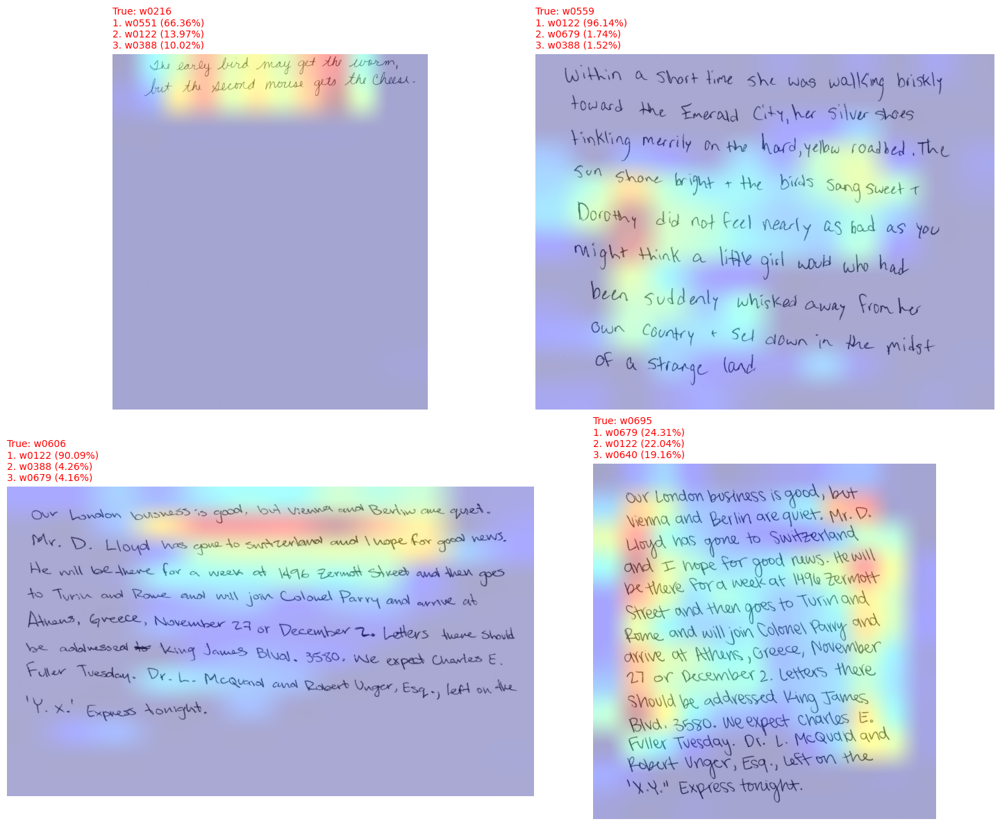

CPU times: user 15.1 s, sys: 599 ms, total: 15.7 s
Wall time: 11.6 s


In [ ]:
%%time

sample_paths = random.choices(test_img_paths,k=4)
sample_trues = [ x.split("/")[4] for x in sample_paths ]

plot_gradcam_grid(sample_paths, sample_trues, model,
                  "out_relu", reload_data2.w_ids475)

    pretty, but predictions are all wrong :(

### error analysis

In [ ]:
heatmap = make_gradcam_heatmap_alt(img_array, model, "out_relu", pred_index=71)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


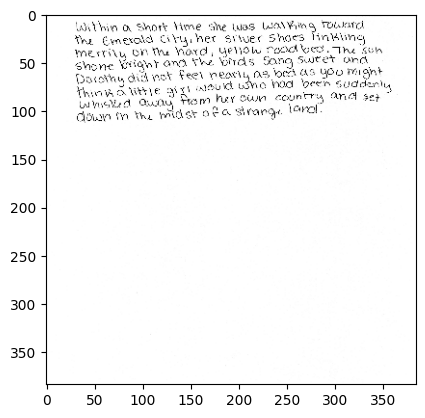

In [ ]:
plt.imshow(img_array[0])

In [ ]:
# Pick two different images
img1 = preprocess_input(get_img_array(random.choice(test_img_paths), size=(384,384)))
img2 = preprocess_input(get_img_array(random.choice(test_img_paths), size=(384,384)))

# Check internal activations of the last conv layer
base_model = model.get_layer("mobilenetv2_1.00_224")
feat_model = keras.models.Model(inputs=base_model.input, outputs=base_model.get_layer("out_relu").output)

act1 = feat_model.predict(img1)
act2 = feat_model.predict(img2)

diff = np.mean(np.abs(act1 - act2))
print(f"Difference in internal features: {diff}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
Difference in internal features: 0.34184330701828003


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


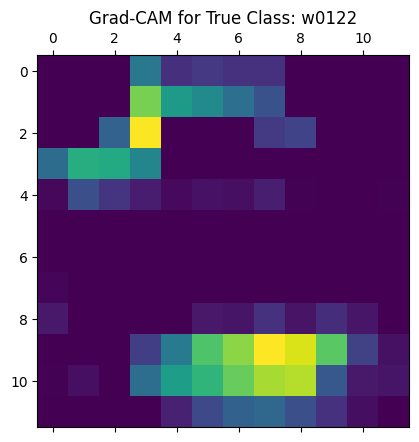

In [ ]:
# 1. Get the index for the CORRECT label (e.g., 'w0122')
# We have to find where 'w0122' is in your list of 475 IDs
true_label = "w0122" # Change this to the actual true label for the image
true_idx = reload_data2.w_ids475.index(true_label)

# 2. Generate heatmap specifically for that index
heatmap = make_gradcam_heatmap_alt(img_array, model, "out_relu", pred_index=true_idx)

# 3. Display it
plt.matshow(heatmap)
plt.title(f"Grad-CAM for True Class: {true_label}")
plt.show()

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    labels='inferred',
    color_mode='rgb',
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    )

Found 2850 files belonging to 475 classes.


In [ ]:
model.evaluate(test_ds)

45/45 ━━━━━━━━━━━━━━━━━━━━ 4747s 104s/step - acc: 0.8648 - loss: 0.6265 - top3_acc: 0.9412


[0.6563184261322021, 0.8642105460166931, 0.9357894659042358]

## New Attempt

Fixing label handling

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    )

Found 2850 files belonging to 475 classes.


In [ ]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

# Check if it matches your manual list
print("Matches manual list?", model_class_names == reload_data2.w_ids475)

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']
Matches manual list? False


In [ ]:
#%%time

import matplotlib.cm as cm

def plot_gradcam_from_dataset(dataset, model, last_conv_layer_name):
    # 1. Grab one batch (e.g., 32 images) from the dataset
    # We take the first batch available
    for images, labels in dataset.take(1):
        # Move to numpy for easier handling
        images = images.numpy()
        labels = labels.numpy()

        # Get the class names directly from the dataset object
        class_names = dataset.class_names

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()

    # Pick 4 random indices from this batch
    indices = np.random.choice(range(len(images)), 4, replace=False)

    for i, idx in enumerate(indices):
        img_array = images[idx:idx+1] # Keep the batch dimension (1, 384, 384, 3)
        true_idx = labels[idx]
        true_name = class_names[true_idx]

        # 2. Get Predictions
        preds = model.predict(img_array, verbose=0)
        # Apply softmax if your model outputs raw logits
        preds = tf.nn.softmax(preds)

        top_3_values, top_3_indices = tf.math.top_k(preds[0], k=3)
        top_3_names = [class_names[j] for j in top_3_indices.numpy()]
        top_3_confs = [f"{v:.2%}" for v in top_3_values.numpy()]

        # 3. Generate Heatmap
        # We pass the image array directly from the dataset
        heatmap = make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name)

        # 4. Superimpose
        # Note: 'img_array' from the dataset might be normalized (-1 to 1 or 0 to 1)
        # We need to de-process it just for display purposes
        low = img_array[0].min()
        high = img_array[0].max()
        display_img = (img_array[0] - low) / (high - low) # Scale to [0, 1]
        display_img = np.uint8(255 * display_img)

        # Colorize and resize heatmap
        heatmap_img = np.uint8(255 * heatmap)
        jet = cm.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[heatmap_img]
        jet_heatmap = keras.utils.array_to_img(jet_heatmap).resize((display_img.shape[1], display_img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        superimposed_img = jet_heatmap * 0.4 + display_img
        superimposed_img = keras.utils.array_to_img(superimposed_img)

        # 5. Plot
        axes[i].imshow(superimposed_img)
        axes[i].axis('off')


        # ... (Inside the loop after getting top_3_names and top_3_confs)

        # 1. Determine the overall status
        is_in_top_3 = true_name in top_3_names

        # 2. Build the title text and colors
        # Start with the True Label
        title_lines = [f"True: {true_name}"]
        line_colors = ['green' if is_in_top_3 else 'red']

        # Check each prediction in the top 3
        for j in range(3):
            pred_name = top_3_names[j]
            conf = top_3_confs[j]
            line_text = f"{j+1}. {pred_name} ({conf})"

            if pred_name == true_name:
                line_text += " [CORRECT]"
                line_colors.append('green')
            elif is_in_top_3:
                # If the true label IS in the top 3, keep others neutral (black)
                line_colors.append('black')
            else:
                # If true label is NOT in top 3, everything is red
                line_colors.append('red')

            title_lines.append(line_text)

        # 3. Create the multi-colored title
        # Matplotlib titles don't support multi-colors per line easily,
        # so we use 'text' or just set the overall axis color based on your rule.

        full_title = "\n".join(title_lines)
        overall_color = 'green' if is_in_top_3 else 'red'

        axes[i].imshow(superimposed_img)
        axes[i].axis('off')
        axes[i].set_title(full_title, color=overall_color, fontsize=10, loc='left', linespacing=1.2)

        #title = f"True: {true_name}\n"
        #title += f"1. {top_3_names[0]} ({top_3_confs[0]})\n"
        #title += f"2. {top_3_names[1]} ({top_3_confs[1]})\n"
        #title += f"3. {top_3_names[2]} ({top_3_confs[2]})"

        #color = 'green' if true_name in top_3_names else 'red'
        #axes[i].set_title(title, color=color, fontsize=10, loc='left')

    plt.tight_layout()
    plt.show()

<timed exec>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


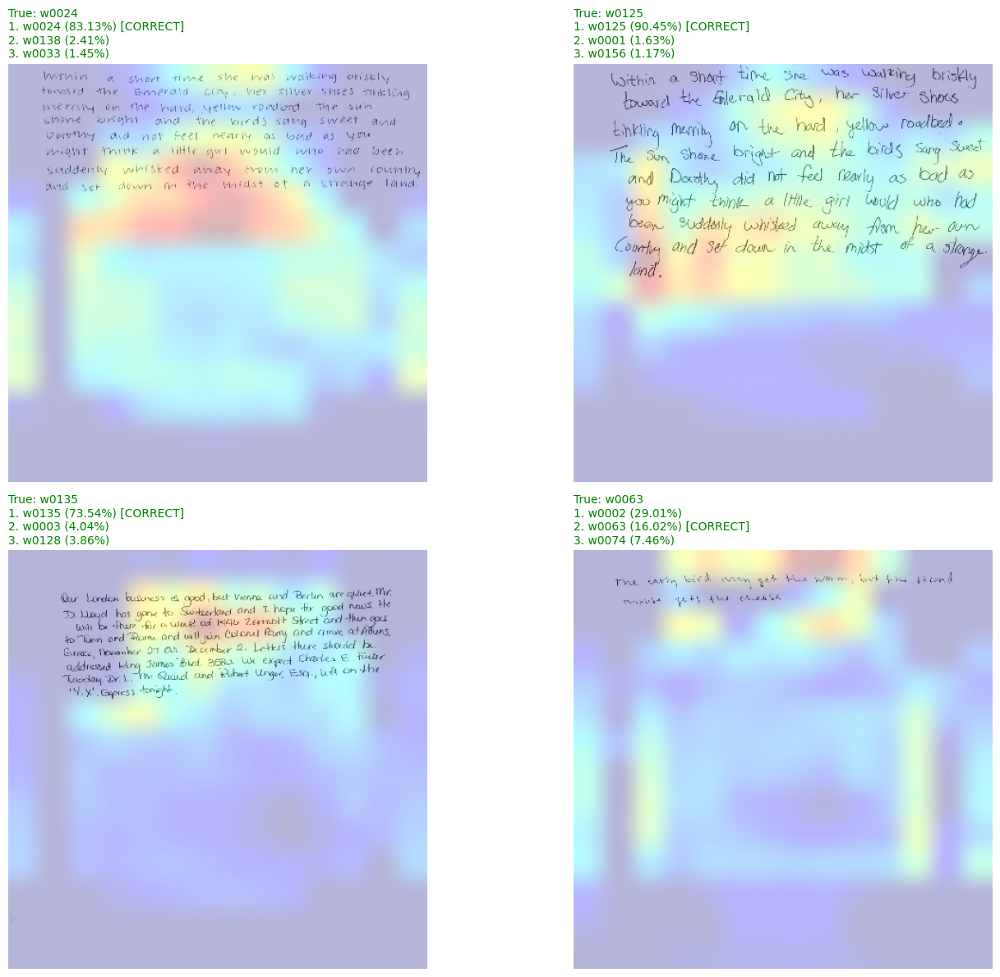

In [ ]:
plot_gradcam_from_dataset(test_ds, model, "out_relu")

    ^^Fixed?

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)
/tmp/ipykernel_684/3545278506.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


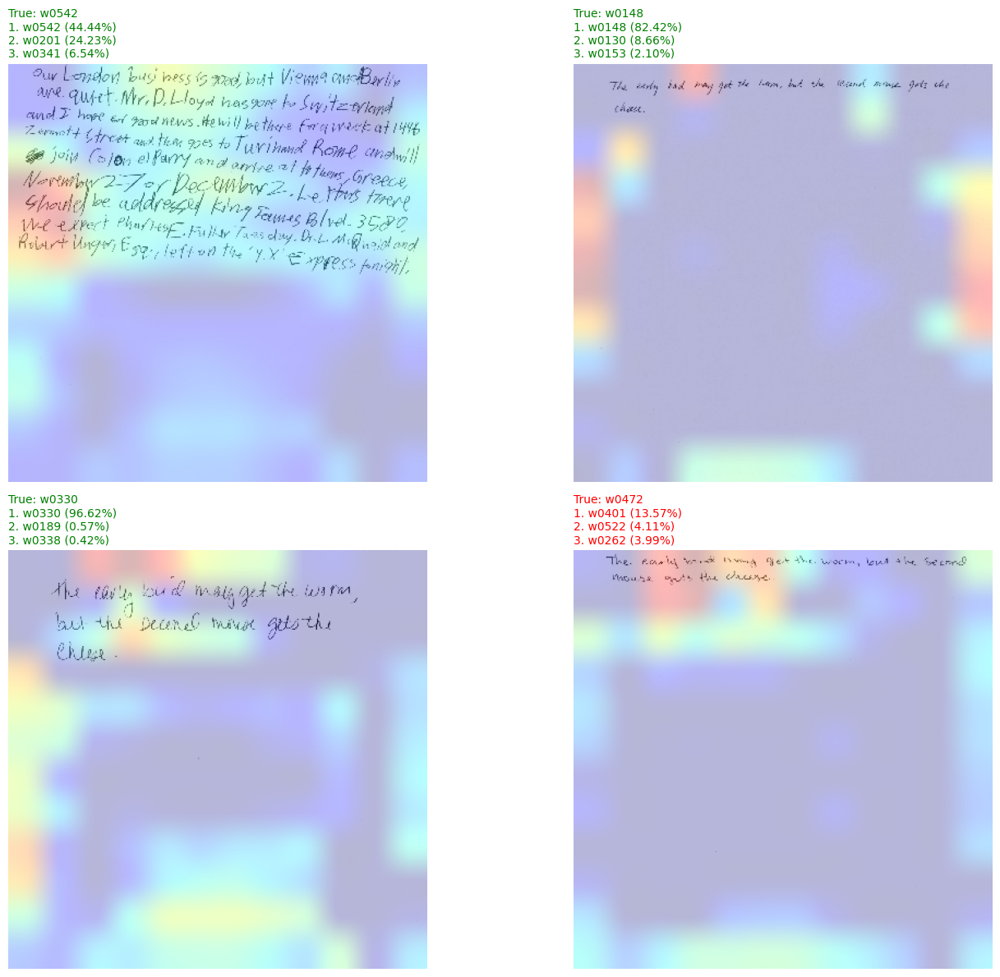

In [ ]:
plot_gradcam_from_dataset(test_ds, model, "out_relu")

# 90 Class

In [ ]:
! unzip /content/Handwriting_Images_90sorted.zip

In [ ]:
IMAGE_SIZE = (442,442)
BATCH_SIZE=64
data_dir = "Handwriting_Images"

In [ ]:
reload_data2.stratify_split_alt(data_dir,90)

Using 90 class labels


In [ ]:
model = load_model("/content/MobileNetV2_highres2.keras")
model.summary()

Model: "mobilenet_highres2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 14, 14, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │       115,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,603,856 (9.93 MB)

 Trainable params: 115,290 (450.35 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 230,582 (900.71 KB)

## Previous

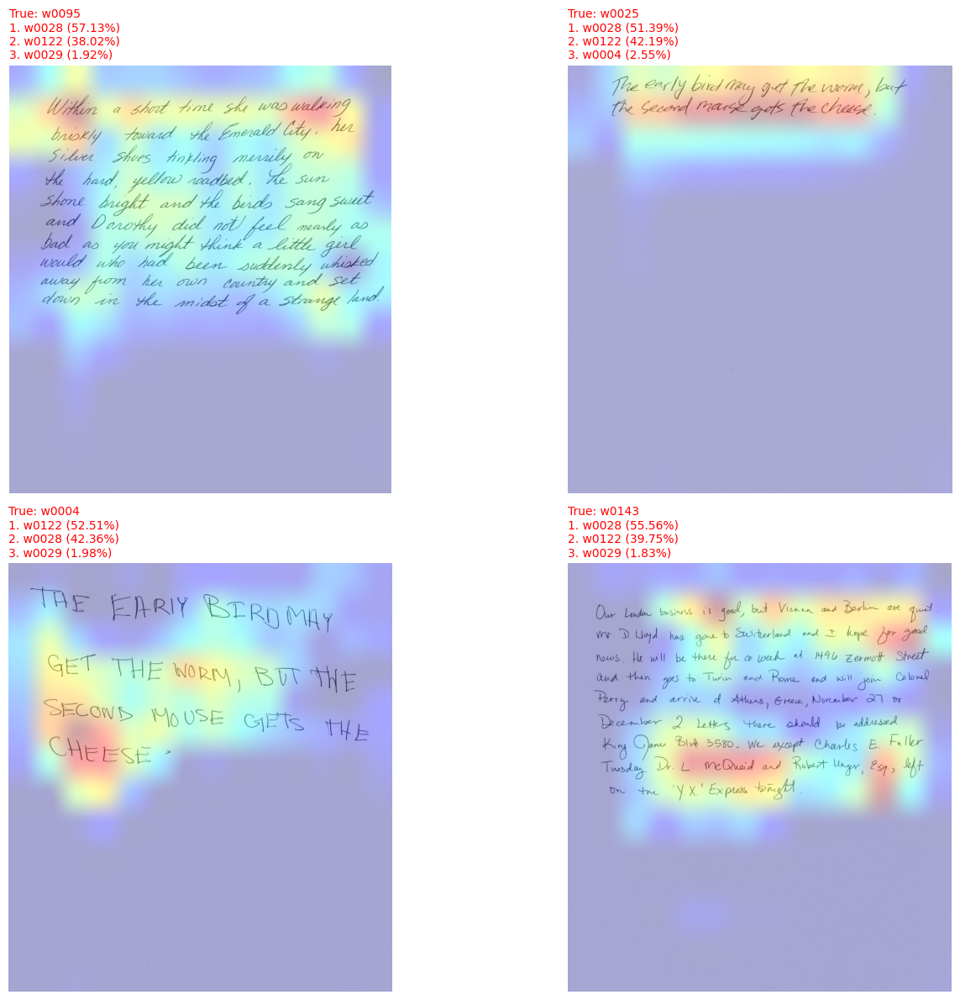

In [ ]:
sample_paths = random.choices(test_img_paths,k=4)
sample_trues = [ x.split("/")[2] for x in sample_paths ]

plot_gradcam_grid(sample_paths, sample_trues, model,
                  "out_relu", reload_data2.w_ids90)

Both models are highlighting "correct" areas but are only predicting the same few classes?

In [ ]:
test_img_paths[:5]

['Handwriting_Images/test/w0071/w0071_s01_pPHR_r02.png',
 'Handwriting_Images/test/w0071/w0071_s03_pLND_r02.png',
 'Handwriting_Images/test/w0071/w0071_s01_pPHR_r03.png',
 'Handwriting_Images/test/w0071/w0071_s01_pWOZ_r02.png',
 'Handwriting_Images/test/w0071/w0071_s03_pWOZ_r01.png']

In [ ]:
test_img_paths=list()
for writer in os.listdir("Handwriting_Images/test"):
    test_images = os.listdir(f"{data_dir}/test/{writer}")

    test_images = [ f"{data_dir}/test/{writer}/{x}" for x in test_images ]

    test_img_paths.extend(test_images)

len(test_img_paths)

540

## New Attempt

In [ ]:
data_dir

'Handwriting_Images'

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    )

Found 540 files belonging to 90 classes.


In [ ]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

# Check if it matches your manual list
print("Matches manual list?", model_class_names == reload_data2.w_ids90)

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']
Matches manual list? True


In [ ]:
model.summary()

Model: "mobilenet_highres2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 442, 442, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 14, 14, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 14, 14, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │       115,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,603,856 (9.93 MB)

 Trainable params: 115,290 (450.35 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 230,582 (900.71 KB)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_2']]
Received: inputs=Tensor(shape=(1, 442, 442, 3))
  warnings.warn(msg)
/tmp/ipykernel_684/3545278506.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


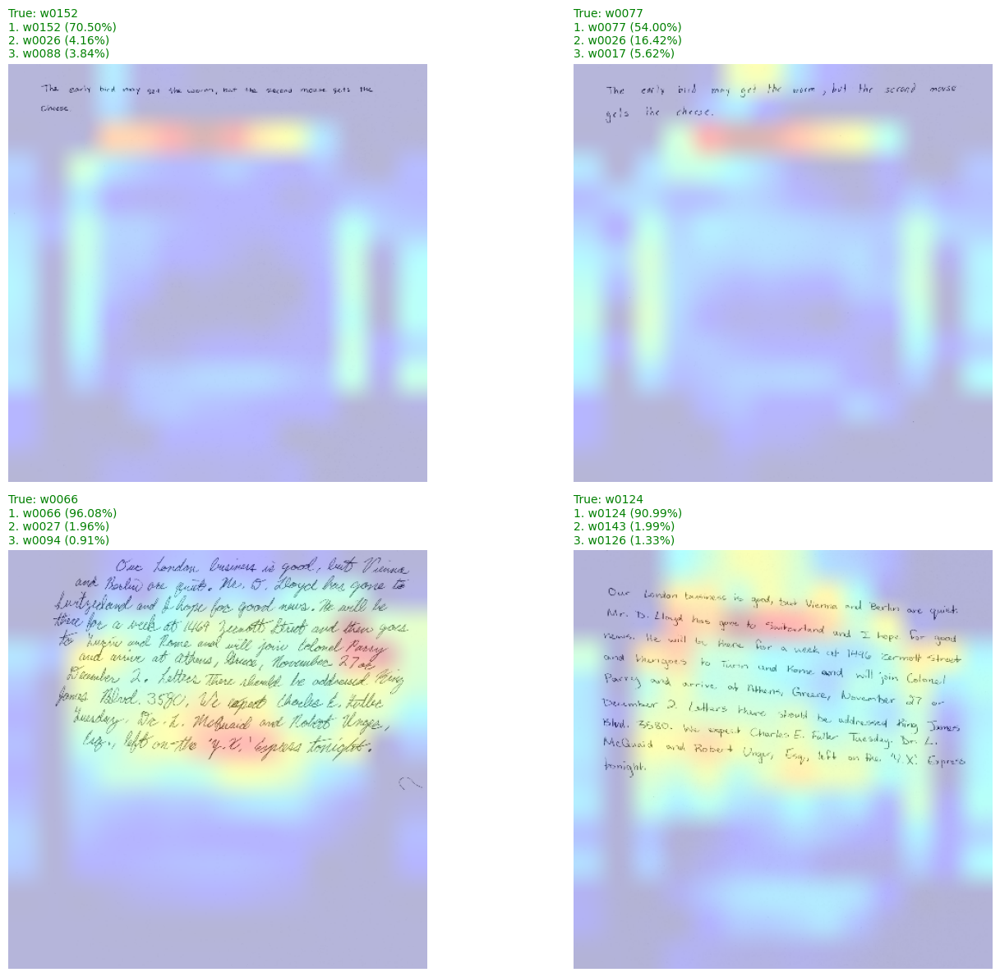

In [ ]:
plot_gradcam_from_dataset(test_ds, model, "out_relu")

<timed exec>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


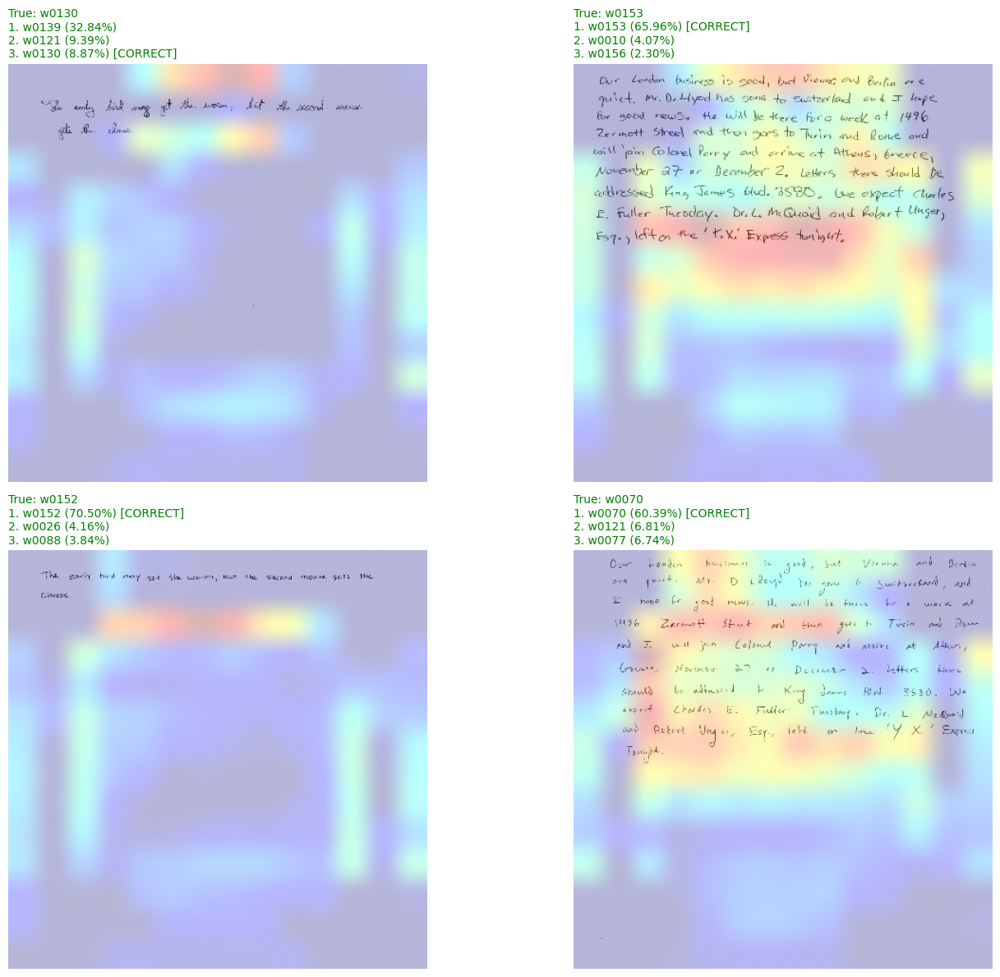

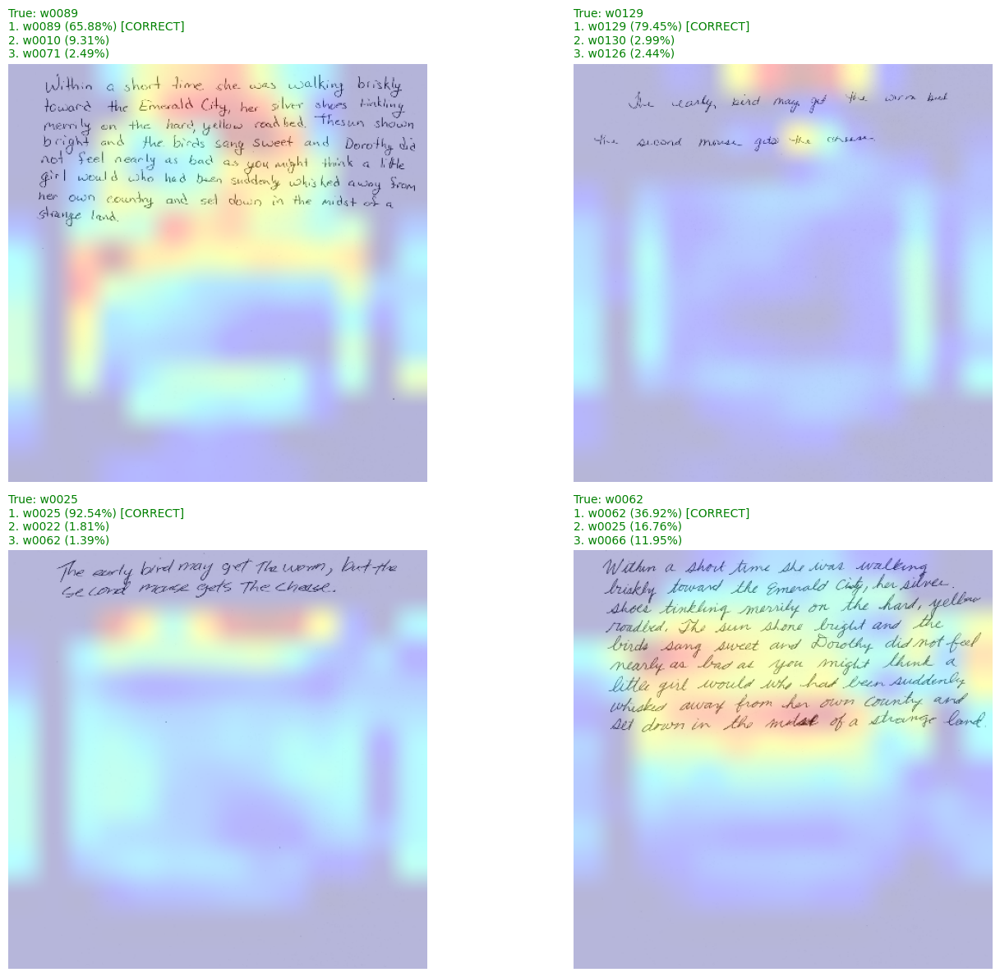

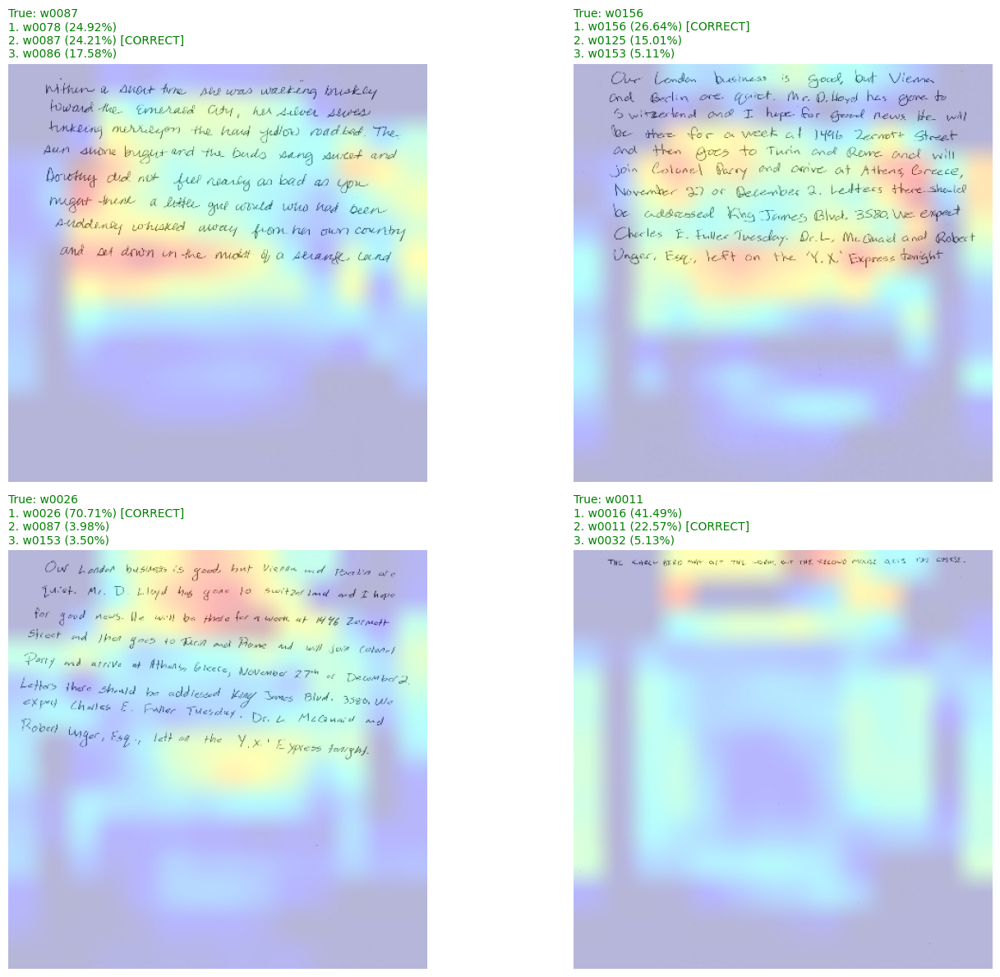

In [ ]:
plot_gradcam_from_dataset(test_ds, model, "out_relu")
plot_gradcam_from_dataset(test_ds, model, "out_relu")
plot_gradcam_from_dataset(test_ds, model, "out_relu")

# LIME

#### imports

In [ ]:
! pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=c2079f929cba45dc231d47ee748400c17e23ccfea7ffa8c4240e690f79960539
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

#### Data Loading

In [ ]:
model = load_model("/content/MobileNetV2_allclass.keras")
model.summary()

Model: "mobilenet_allclass"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [ ]:
data_dir = "/content/Data"
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=(384,384),
    batch_size=BATCH_SIZE,
    )

Found 2850 files belonging to 475 classes.


In [ ]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']


## Apply LIME

In [ ]:
def scale_for_display(img):
    """Helper to ensure image is in [0, 1] range for imshow"""
    img = np.array(img, dtype=float)
    low, high = img.min(), img.max()
    if high > low:
        return (img - low) / (high - low)
    return img

def explain_lime_from_dataset(dataset, model, num_samples=1000):
    # 1. Grab a batch and pick a random image
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    idx = np.random.randint(0, len(images_np))
    raw_img = images_np[idx]

    # Handle range for LIME (needs [0, 1] or [0, 255])
    if raw_img.min() < 0:
        raw_img = (raw_img + 1.0) / 2.0

    # 2. Define the prediction function
    def predict_fn(instances):
        # Scale back to [-1, 1] for MobileNetV2
        instances = (instances * 2.0) - 1.0
        preds = model.predict(instances, verbose=0)
        return tf.nn.softmax(preds).numpy()

    # 3. Run the explainer
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(
        raw_img.astype('double'),
        predict_fn,
        top_labels=5,
        hide_color=0,
        num_samples=num_samples
    )

    # 4. INITIALIZE THE PLOT (This fixes the 'ax' error)
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Column 1: Original Image
    ax[0].imshow(scale_for_display(raw_img))
    ax[0].set_title(f"Original\nTrue: {class_names[labels_np[idx]]}")
    ax[0].axis('off')

    # Column 2: Pros & Cons
    # Green = Positive impact on prediction, Red = Negative
    temp_pn, mask_pn = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False
    )
    ax[1].imshow(mark_boundaries(scale_for_display(temp_pn), mask_pn))
    ax[1].set_title(f"Pros (Green) / Cons (Red)\nPred: {class_names[explanation.top_labels[0]]}")
    ax[1].axis('off')

    # Column 3: The Evidence (Just the bits that helped)
    temp_p, mask_p = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
    )
    ax[2].imshow(mark_boundaries(scale_for_display(temp_p), mask_p))
    ax[2].set_title(f"Supportive Features Only")
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

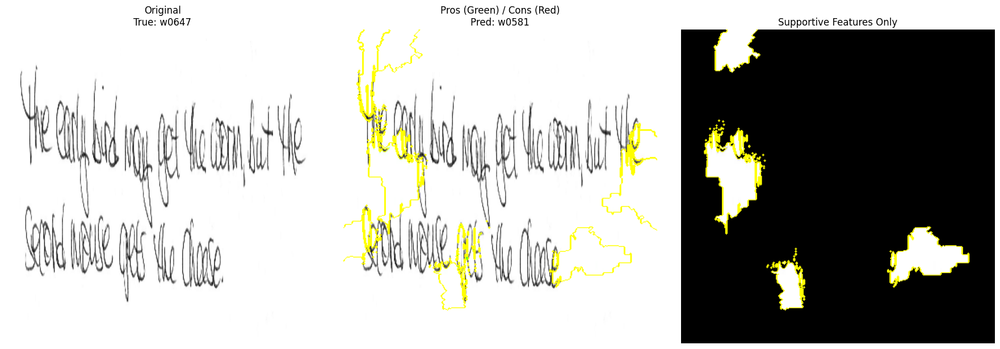

CPU times: user 17min 27s, sys: 20.6 s, total: 17min 47s
Wall time: 13min 55s


In [ ]:
%%time
explain_lime_from_dataset(test_ds, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

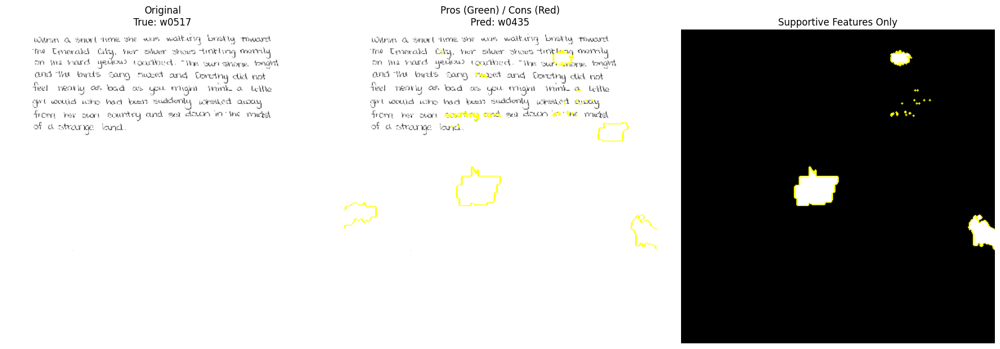

In [ ]:
explain_lime_from_dataset(test_ds, model)

### Combining

In [ ]:
def plot_ultimate_explanation(dataset, model, last_conv_layer_name, num_samples=500):
    # 1. Grab a sample from the dataset
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    idx = np.random.randint(0, len(images_np))
    img_tensor = images_np[idx:idx+1] # Shape (1, 384, 384, 3)
    true_label = class_names[labels_np[idx]]

    # 2. Get Model Prediction
    preds = model.predict(img_tensor, verbose=0)
    preds_norm = tf.nn.softmax(preds)
    pred_idx = np.argmax(preds_norm[0])
    pred_label = class_names[pred_idx]
    confidence = preds_norm[0][pred_idx]

    # --- START CALCULATIONS ---

    # 3. Generate Grad-CAM
    heatmap = make_gradcam_heatmap_alt(img_tensor, model, last_conv_layer_name)

    # 4. Generate LIME
    raw_img_for_lime = (img_tensor[0] + 1.0) / 2.0 if img_tensor[0].min() < 0 else img_tensor[0]
    explainer = lime_image.LimeImageExplainer()

    def predict_fn(instances):
        # Assuming MobileNetV2 [-1, 1] preprocessing
        instances = (instances * 2.0) - 1.0
        p = model.predict(instances, verbose=0)
        return tf.nn.softmax(p).numpy()

    explanation = explainer.explain_instance(
        raw_img_for_lime.astype('double'),
        predict_fn,
        top_labels=5,
        num_samples=num_samples
    )

    # --- START PLOTTING ---

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # 1. ORIGINAL IMAGE
    axes[0, 0].imshow(scale_for_display(raw_img_for_lime))
    axes[0, 0].set_title(f"Original\nTrue: {true_label}", fontsize=12)
    axes[0, 0].axis('off')

    # 2. LIME: PROS & CONS
    temp_pn, mask_pn = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False
    )
    axes[0, 1].imshow(mark_boundaries(scale_for_display(temp_pn), mask_pn))
    axes[0, 1].set_title(f"LIME: Pros (Green) / Cons (Red)\nPred: {pred_label} ({confidence:.1%})", fontsize=12)
    axes[0, 1].axis('off')

    # 3. LIME: SUPPORTIVE ONLY
    temp_p, mask_p = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True
    )
    axes[1, 0].imshow(mark_boundaries(scale_for_display(temp_p), mask_p))
    axes[1, 0].set_title("LIME: Top Supportive Features", fontsize=12)
    axes[1, 0].axis('off')

    # 4. GRAD-CAM
    # Colorize Grad-CAM
# --- 4. GRAD-CAM (FIXED) ---
    # 1. Resize heatmap to match image size (384, 384)
    # This uses bilinear interpolation to make the 12x12 grid a smooth 384x384 overlay
    heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (img_tensor.shape[1], img_tensor.shape[2]))
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()

    # 2. Colorize the upscaled heatmap
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[np.uint8(255 * heatmap_resized)]

    # 3. Use the original image for overlay
    display_img = scale_for_display(raw_img_for_lime)

    # Now both are (384, 384, 3)!
    superimposed_img = jet_heatmap * 0.4 + display_img

    axes[1, 1].imshow(scale_for_display(superimposed_img))
    axes[1, 1].set_title(f"Grad-CAM: {last_conv_layer_name} Layer", fontsize=12)
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

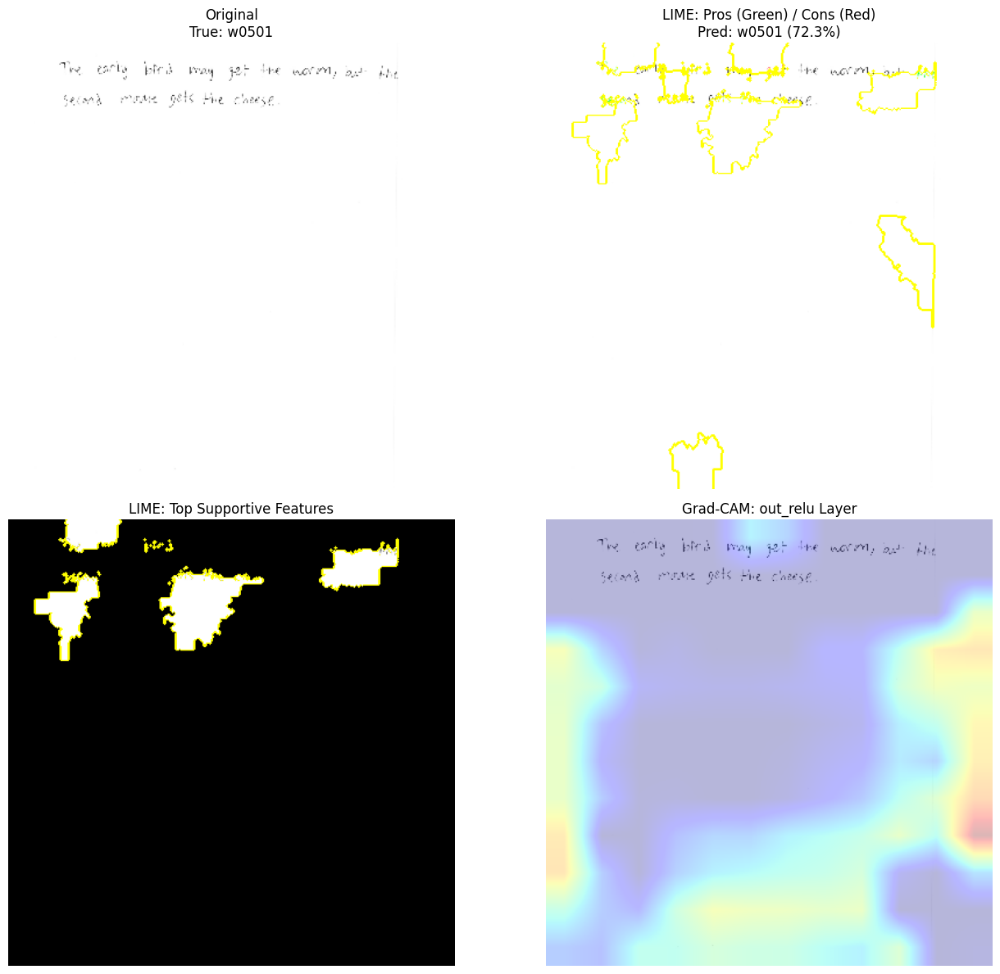

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

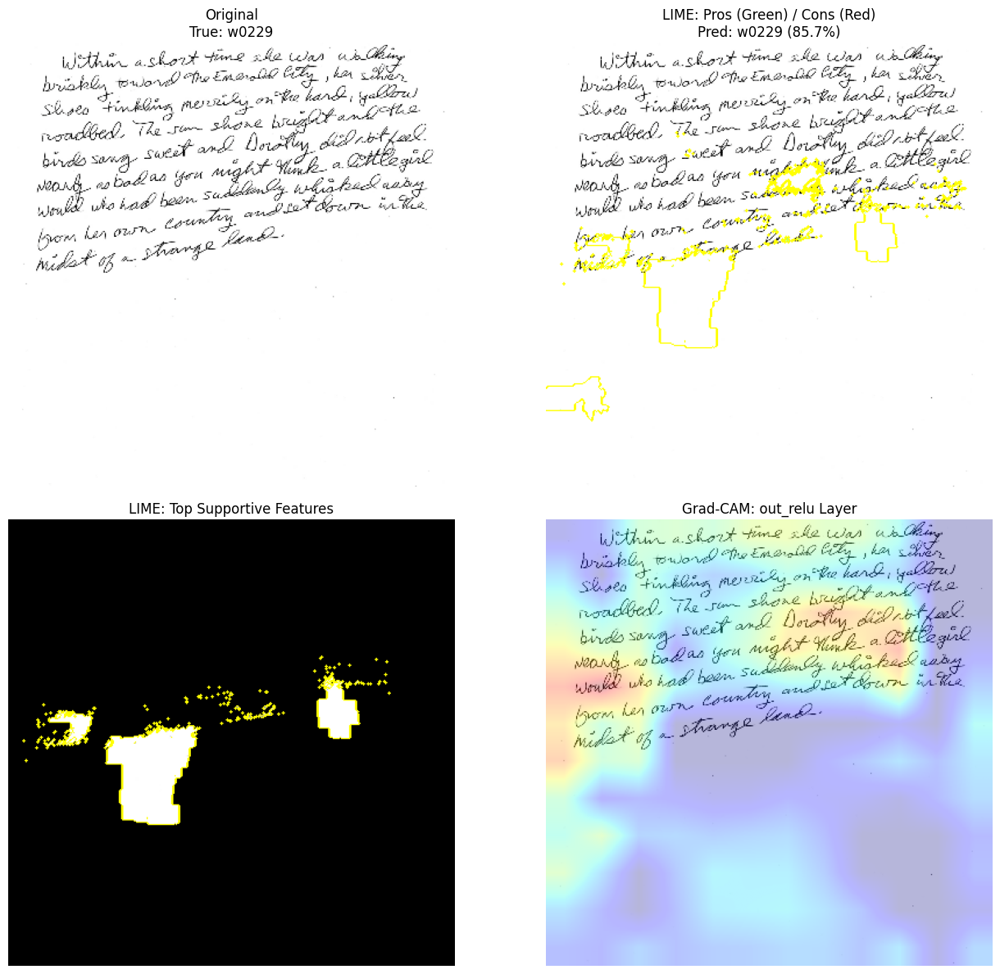

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

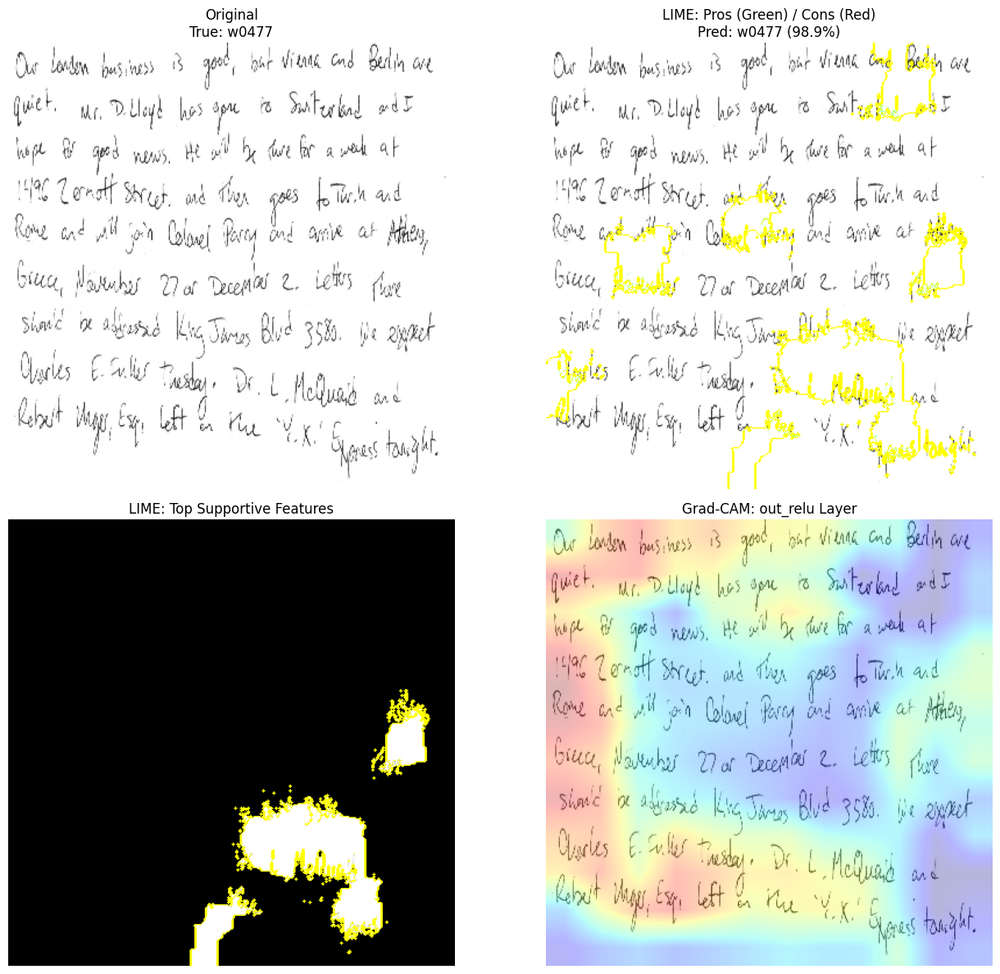

CPU times: user 25min 54s, sys: 23.8 s, total: 26min 18s
Wall time: 20min 38s


In [ ]:
%%time
plot_ultimate_explanation(test_ds, model, "out_relu")
plot_ultimate_explanation(test_ds, model, "out_relu")
plot_ultimate_explanation(test_ds, model, "out_relu")

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

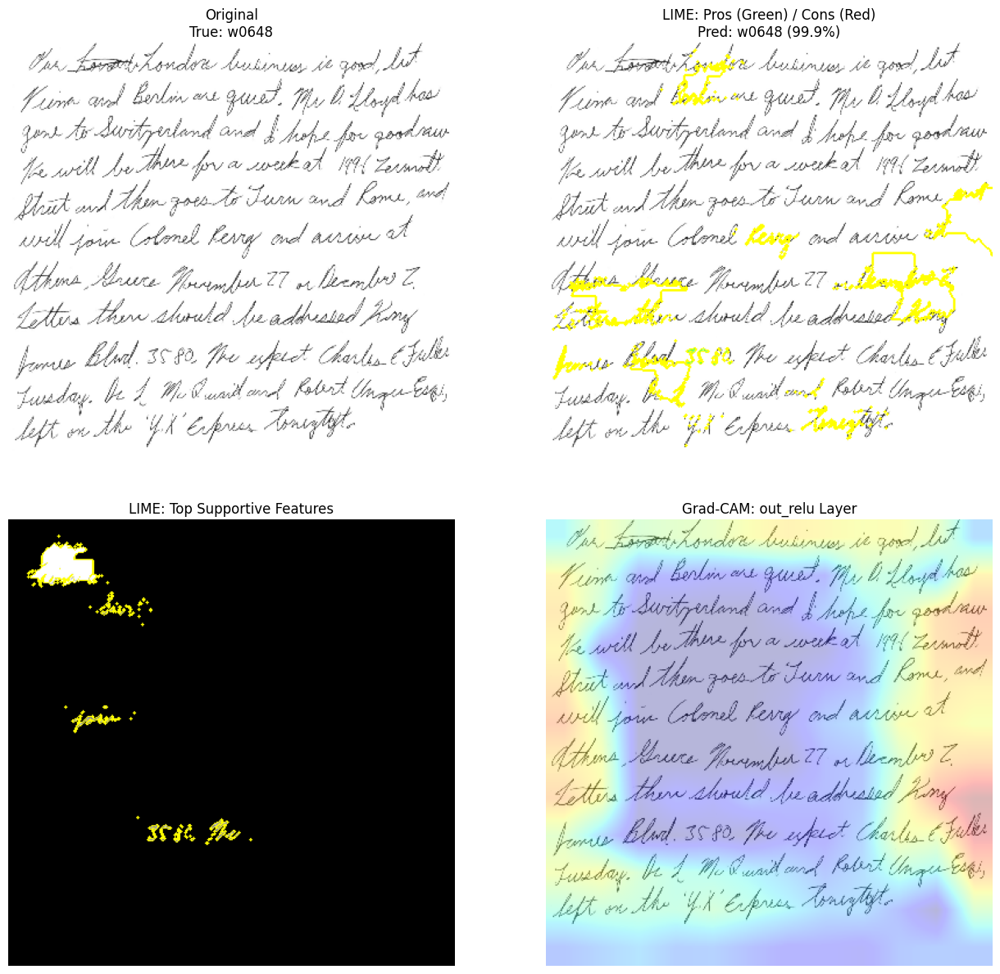

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

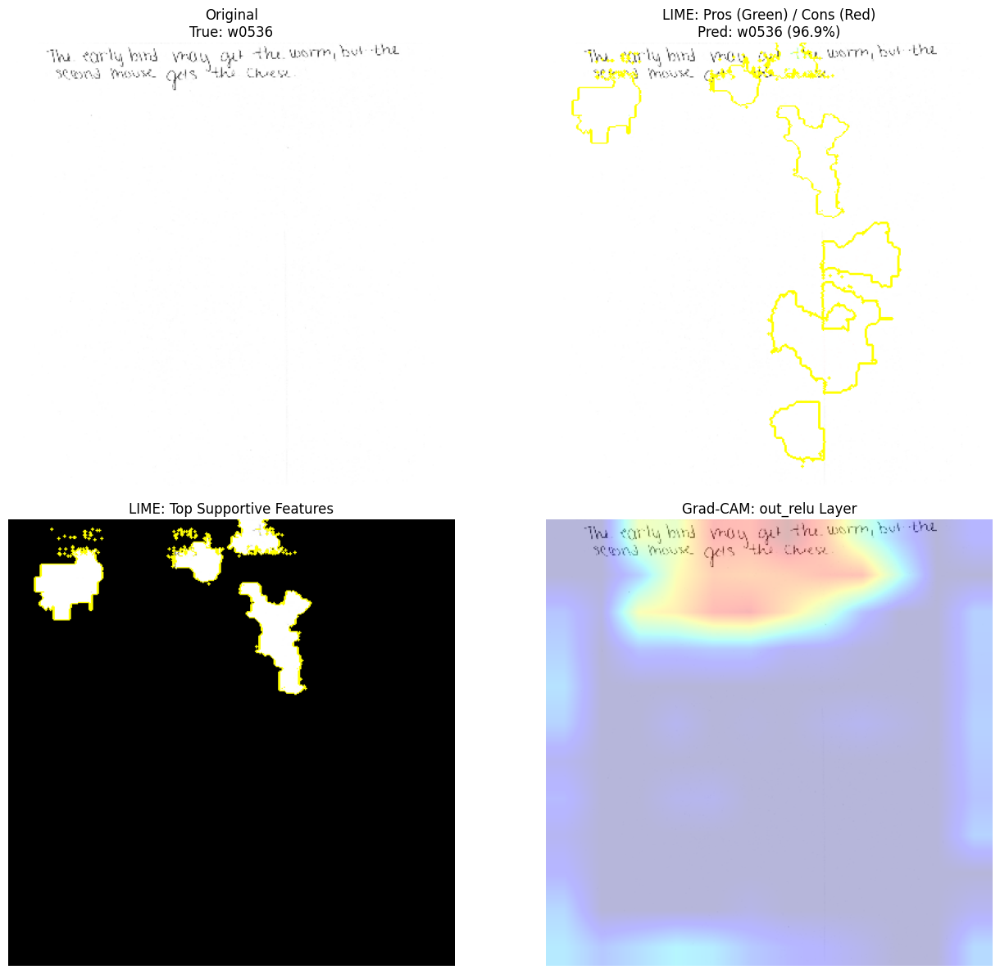

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

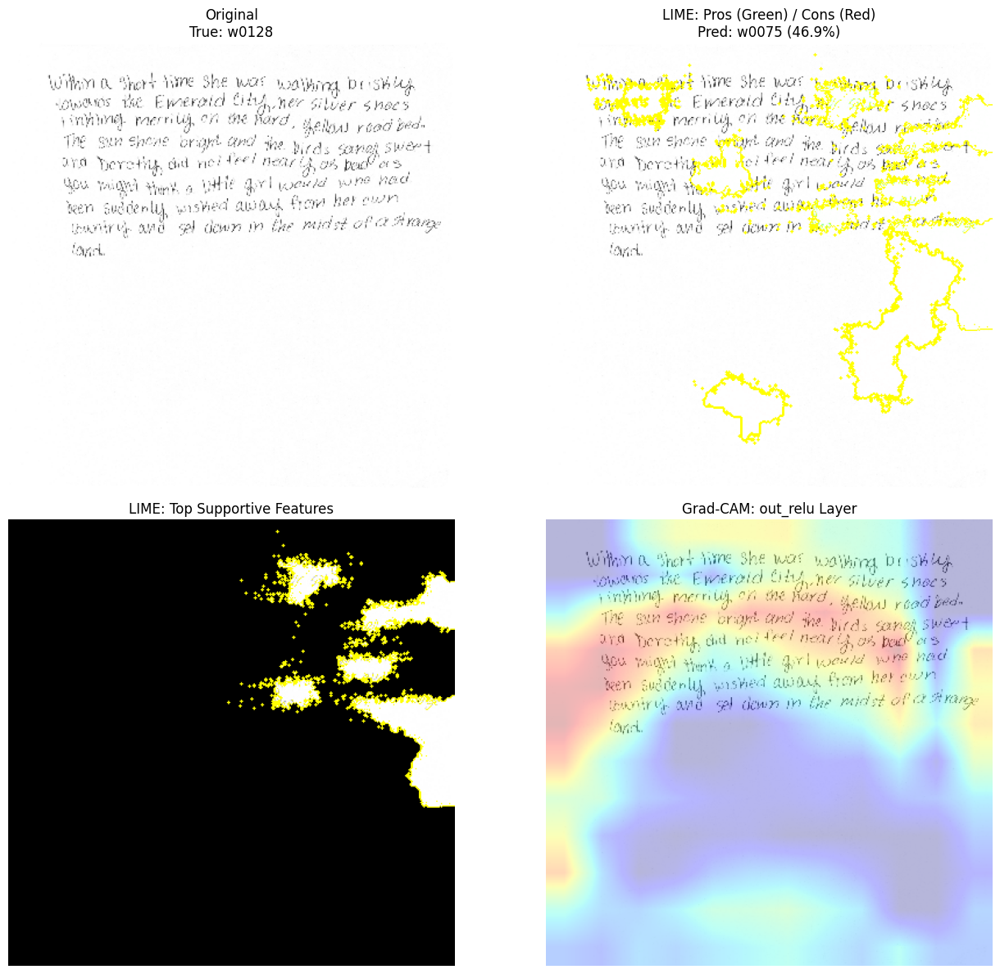

CPU times: user 25min 50s, sys: 25.1 s, total: 26min 16s
Wall time: 19min 32s


In [ ]:
%%time
plot_ultimate_explanation(test_ds, model, "out_relu")
plot_ultimate_explanation(test_ds, model, "out_relu")
plot_ultimate_explanation(test_ds, model, "out_relu")

    Note: Possible data leakage since train/val/test images are chosen randomly

# NEXT: run w/control for data leakage

In [ ]:
model = load_model("/content/MobileNetV2_allclass3.keras")
model.summary()

Model: "mobilenet_allclass3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [ ]:
! unzip -q /content/AllClass3_test_ds.zip

In [ ]:
data_dir = "/content/content/Data"
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=(384,384),
    batch_size=64,
    )

Found 2850 files belonging to 475 classes.


In [ ]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']


<timed exec>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


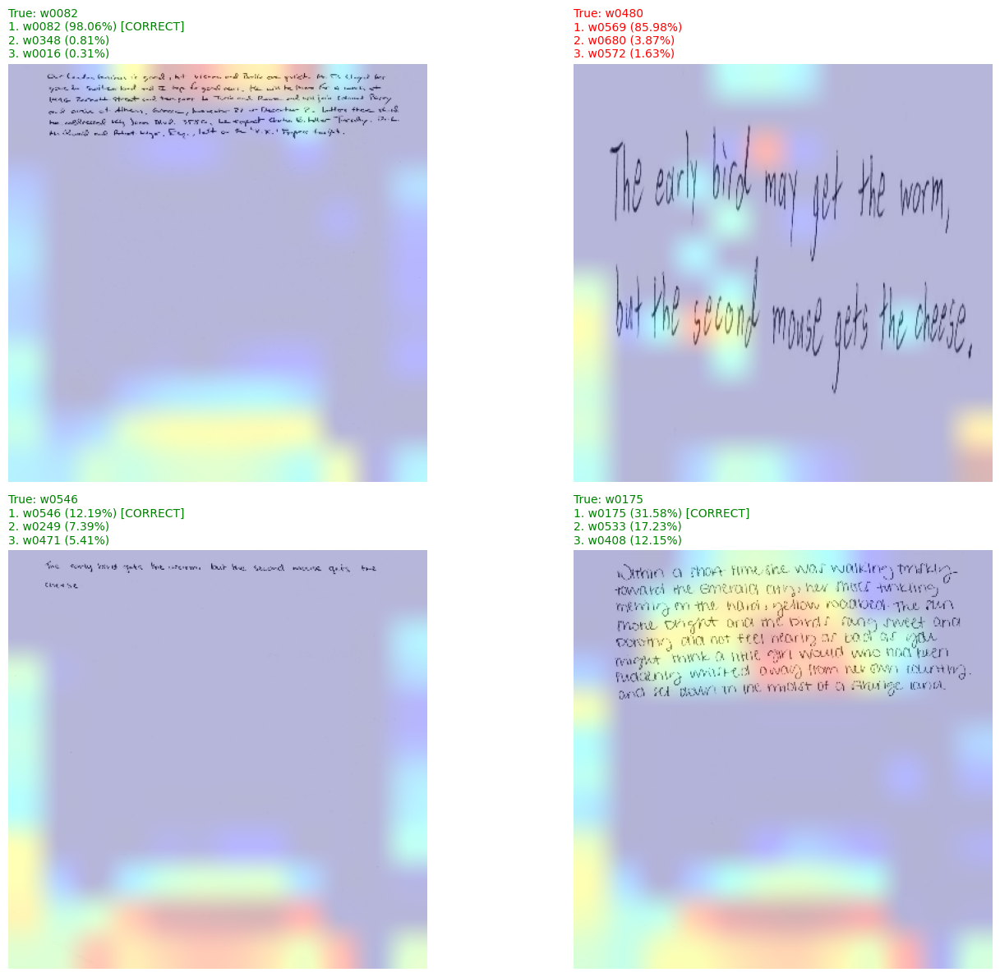

In [ ]:
plot_gradcam_from_dataset(test_ds, model, "out_relu")

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

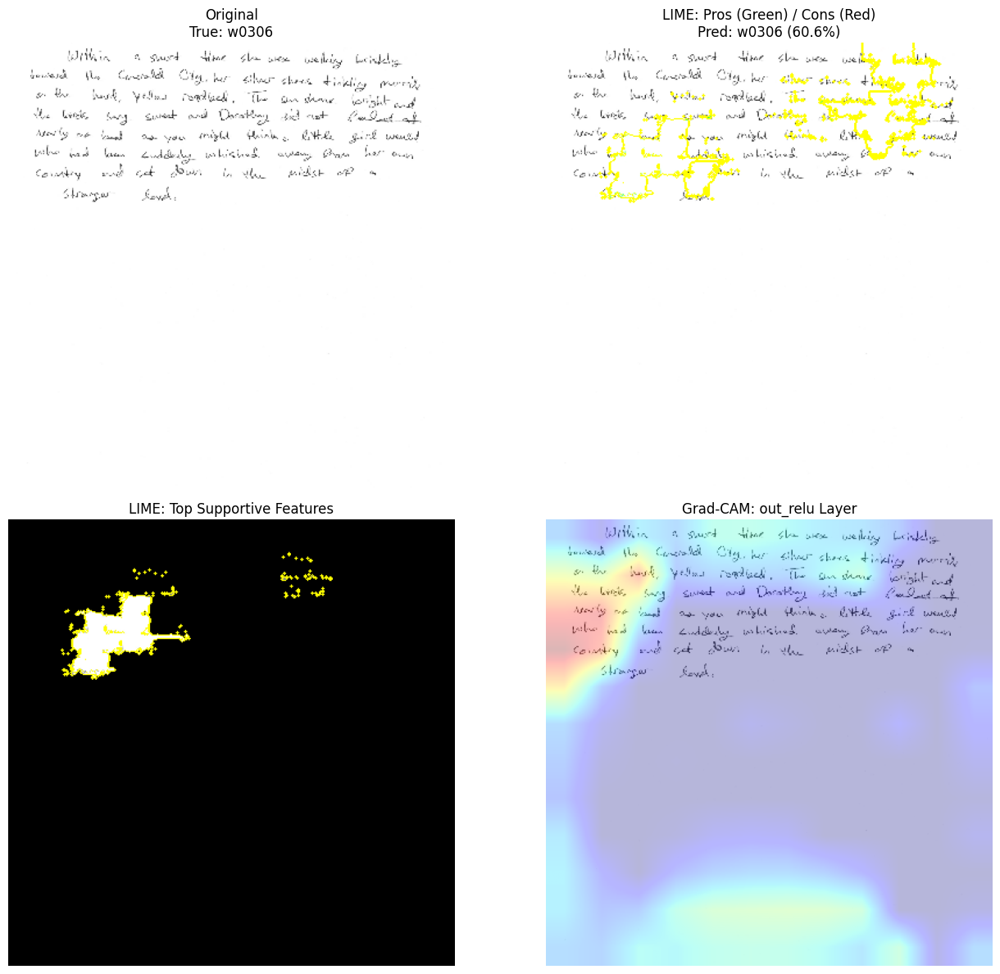

CPU times: user 22min 11s, sys: 18.6 s, total: 22min 29s
Wall time: 16min 13s


In [ ]:
%%time
plot_ultimate_explanation(test_ds, model, "out_relu")

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

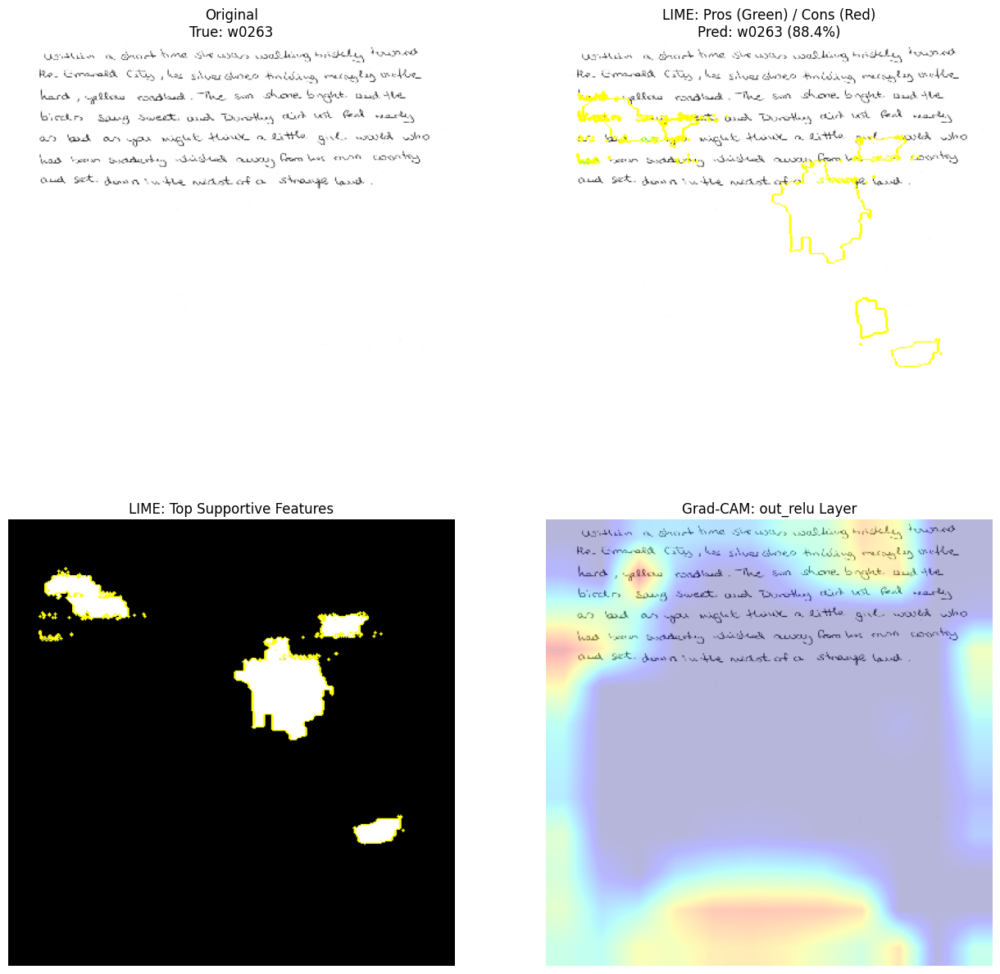

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

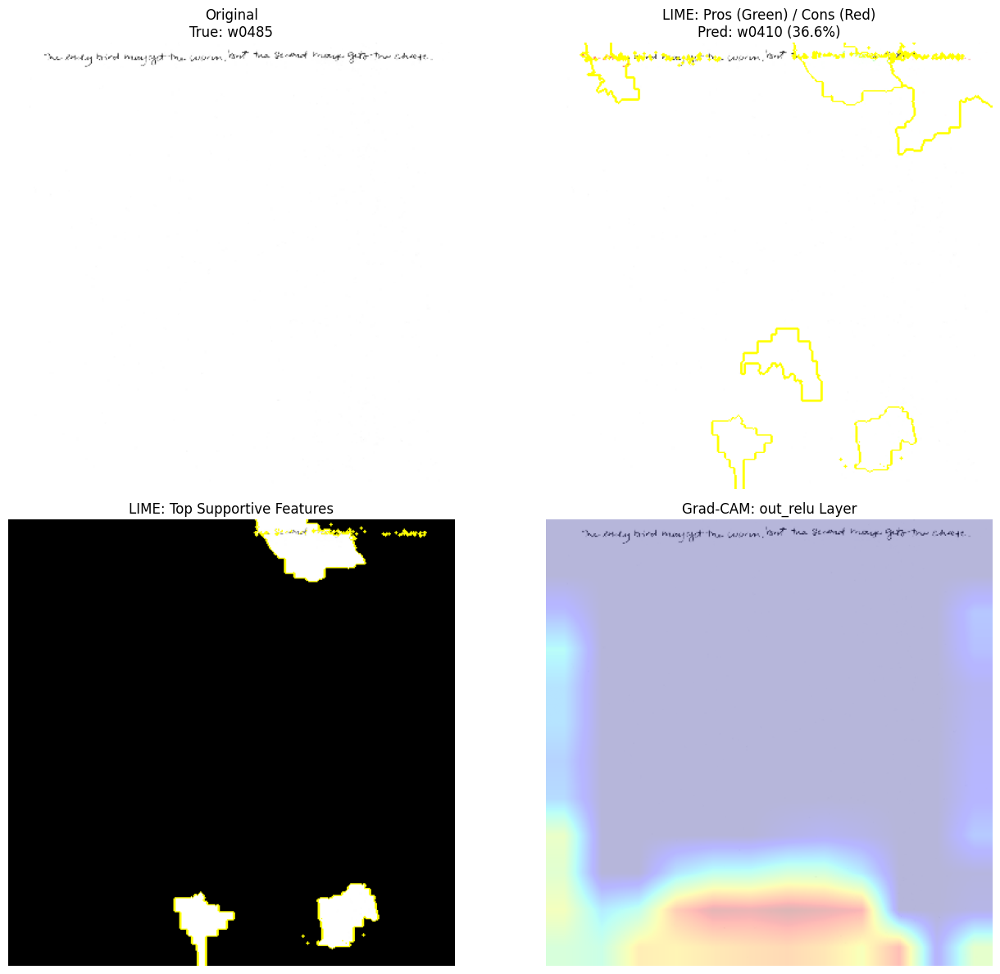

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

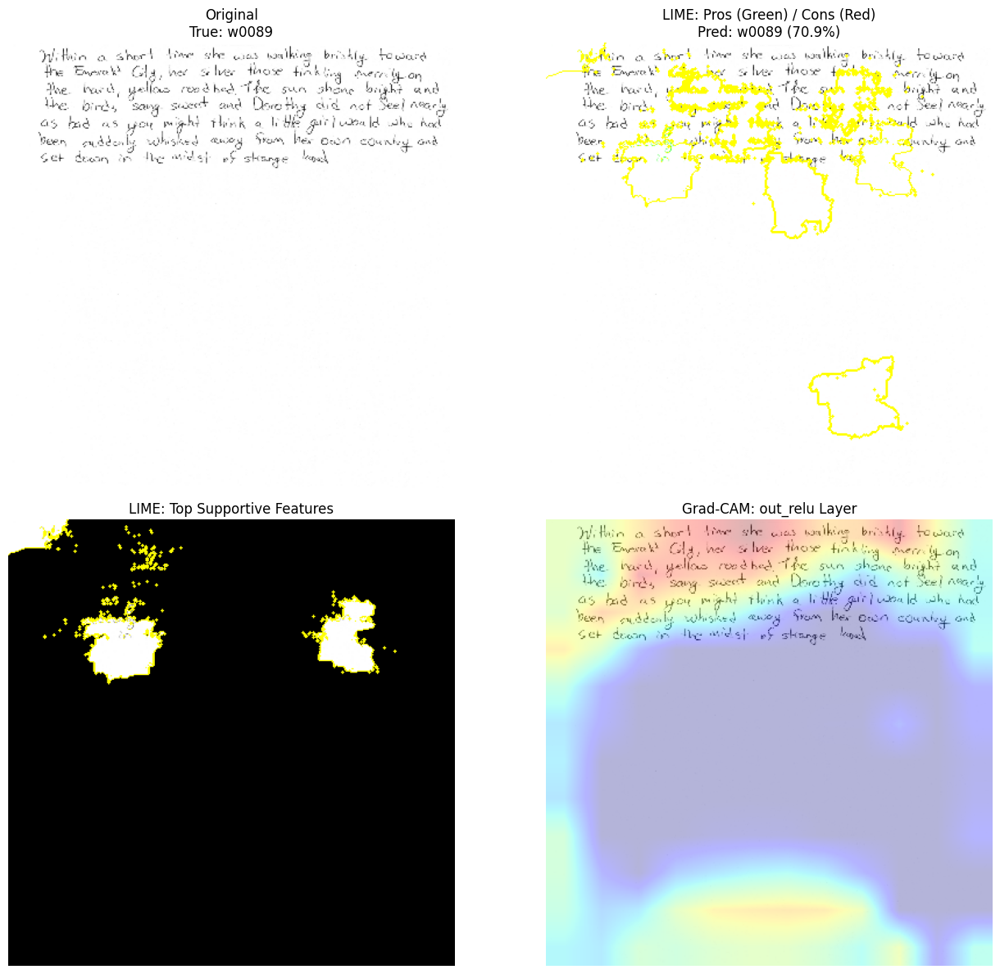

CPU times: user 1h 5min 58s, sys: 44.7 s, total: 1h 6min 42s
Wall time: 45min 13s


In [ ]:
%%time
plot_ultimate_explanation(test_ds, model, "out_relu")
plot_ultimate_explanation(test_ds, model, "out_relu")
plot_ultimate_explanation(test_ds, model, "out_relu")

# Standardized input model
## (didn't work; continued in `XAI2.ipynb`)

In [ ]:
model = load_model("/content/MobileNetV2_allclass2.keras")
model.summary()

Model: "mobilenet_allclass2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 12, 12, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 475)            │       608,475 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,083,411 (15.58 MB)

 Trainable params: 608,475 (2.32 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 1,216,952 (4.64 MB)

In [ ]:
! unzip -q /content/AllClass2_test.zip

In [ ]:
data_dir = "/content/content/New_Data"
test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{data_dir}/test",
    label_mode='int',
    color_mode='rgb',
    image_size=(384,384),
    batch_size=64,
    )

Found 2850 files belonging to 475 classes.


In [ ]:
model_class_names = test_ds.class_names
print(model_class_names[:10])

['w0001', 'w0002', 'w0003', 'w0004', 'w0005', 'w0006', 'w0009', 'w0010', 'w0011', 'w0012']


In [ ]:
def make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name, pred_index=None):
    # 1. Access the base MobileNetV2 layer
    # Note: Ensure this name matches exactly what is in your model.summary()
    base_model = model.get_layer("mobilenetv2_1.00_224")

    grad_model = keras.models.Model(
        inputs=[base_model.inputs],
        outputs=[base_model.get_layer(last_conv_layer_name).output, base_model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, base_preds = grad_model(img_array)

        # 3. Manually pass base_preds through the Top layers
        found_base = False
        x = base_preds
        for layer in model.layers:
            if found_base:
                x = layer(x)
            if layer == base_model:
                found_base = True

        # Protection: If x is still spatial (Batch, 12, 12, 475), pool it
        if len(x.shape) > 2:
            final_preds = tf.reduce_mean(x, axis=[1, 2])
        else:
            final_preds = x

        if pred_index is None:
            # Get the scalar index of the top class
            pred_index = tf.argmax(final_preds[0])

        # Force pred_index to be a scalar integer to fix the TypeError
        pred_index = int(pred_index)
        class_channel = final_preds[:, pred_index]

    # 4. Calculate gradients
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # 5. Multiply the feature map by the importance of each channel
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # 6. Normalize
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy()

def plot_gradcam_from_dataset(dataset, model, last_conv_layer_name):
    for images, labels in dataset.take(1):
        images_np = images.numpy()
        labels_np = labels.numpy()
        class_names = dataset.class_names

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    indices = np.random.choice(range(len(images_np)), 4, replace=False)

    for i, idx in enumerate(indices):
        img_array = images_np[idx:idx+1]
        true_name = class_names[labels_np[idx]]

        # 2. Get Predictions
        preds = model.predict(img_array, verbose=0)
        preds = tf.nn.softmax(preds)
        top_3_values, top_3_indices = tf.math.top_k(preds[0], k=3)
        top_3_names = [class_names[j] for j in top_3_indices.numpy()]
        top_3_confs = [f"{v:.2%}" for v in top_3_values.numpy()]

        # 3. Generate Heatmap
        heatmap = make_gradcam_heatmap_alt(img_array, model, last_conv_layer_name)

        # 4. Superimpose with Resize Fix
        # First, resize heatmap (12x12) to match image size (e.g., 384x384)
        heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (img_array.shape[1], img_array.shape[2]))
        heatmap_resized = tf.squeeze(heatmap_resized).numpy()

        # Scale original image for display
        low, high = img_array[0].min(), img_array[0].max()
        display_img = (img_array[0] - low) / (high - low)
        display_img = np.uint8(255 * display_img)

        # Colorize
        jet = cm.get_cmap("jet")
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[np.uint8(255 * heatmap_resized)]
        jet_heatmap = keras.utils.array_to_img(jet_heatmap).resize((display_img.shape[1], display_img.shape[0]))
        jet_heatmap = keras.utils.img_to_array(jet_heatmap)

        superimposed_img = jet_heatmap * 0.4 + display_img

        # 5. Plot and Titles
        axes[i].imshow(superimposed_img / 255.0)
        axes[i].axis('off')

        is_in_top_3 = true_name in top_3_names
        title_lines = [f"True: {true_name}"]
        for j in range(3):
            line_text = f"{j+1}. {top_3_names[j]} ({top_3_confs[j]})"
            if top_3_names[j] == true_name: line_text += " [CORRECT]"
            title_lines.append(line_text)

        full_title = "\n".join(title_lines)
        axes[i].set_title(full_title, color='green' if is_in_top_3 else 'red', loc='left')

    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 384, 384, 3))
  warnings.warn(msg)


InvalidArgumentError: {{function_node __wrapped__ArgMax_device_/job:localhost/replica:0/task:0/device:CPU:0}} Expected dimension in the range [0, 0), but got 0 [Op:ArgMax] name: 

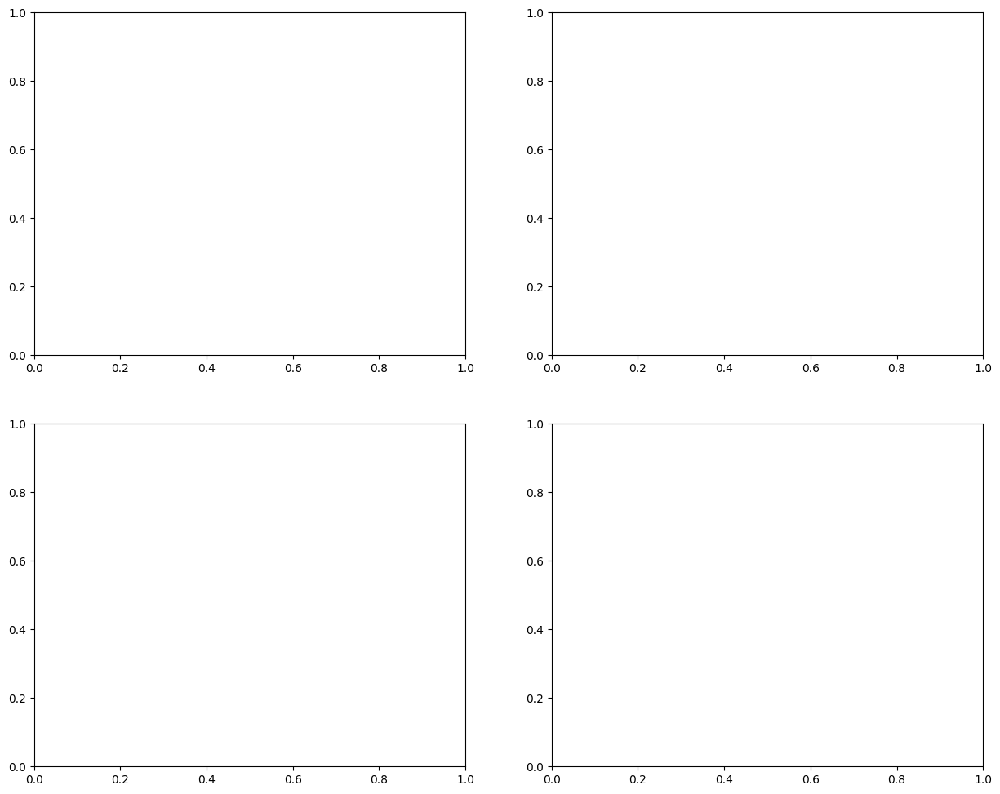

In [ ]:
%%time
plot_gradcam_from_dataset(test_ds, model, "out_relu")
plot_gradcam_from_dataset(test_ds, model, "out_relu")
plot_gradcam_from_dataset(test_ds, model, "out_relu")